# Import and Utils

In [2]:
import pandas as pd
import numpy as np
import zstandard as zstd
from collections import defaultdict
from tqdm import tqdm
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from typing import Iterable, Optional, Union, Dict, Sequence
import math

In [218]:
def prepare_session(mbo, symbol, session_date, tz='America/New_York', conversion=True):
    # ts_event est en ns → datetime UTC
    mbo = mbo[mbo['symbol'] == symbol].copy()
    mbo['ts'] = pd.to_datetime(mbo['ts_event'], unit='ns', utc=True)
    mbo['ts_et'] = mbo['ts'].dt.tz_convert(tz)

    # garder la date choisie ('2025-07-22') et la plage 9:30–16:00
    d = pd.to_datetime(session_date).date()
    sod = pd.Timestamp(d, tz=tz) + pd.Timedelta(hours=9, minutes=30)
    eod = pd.Timestamp(d, tz=tz) + pd.Timedelta(hours=16)
    mbo = mbo[(mbo['ts_et'] >= sod) & (mbo['ts_et'] < eod)]
    mbo = mbo.sort_values(['ts_et','sequence'])
    mbo['minute'] = mbo['ts_et'].dt.floor('min')           # minute ET
    mbo['px'] = mbo['price'] / 1e9  if conversion else mbo['price']                   # $ (prix en nanos → dollars)
    return mbo

In [294]:
# Generated with AI

def plot_timeseries_pro(
    data: Union[pd.DataFrame, Dict[str, pd.Series]],
    columns: Optional[Sequence[str]] = None,
    *,
    title: Optional[str] = None,
    ylabel: Optional[str] = None,
    figsize: tuple = (12, 5),
    dpi: int = 160,
    lw: float = 1.8,
    alpha: float = 0.95,
    markers: bool = False,                 # ajoute des marqueurs (utile pour 1-min, etc.)
    ma_window: Optional[int] = None,       # moyenne mobile (même fenêtre pour toutes les colonnes)
    std_band: bool = False,                # ajoute une bande ±1σ autour de chaque série
    clip_quantiles: Optional[tuple] = None,# ex: (0.01, 0.99) pour limiter les extrêmes
    events: Optional[Iterable[pd.Timestamp]] = None,  # vlines événements
    day_dividers: bool = False,            # lignes verticales début de journée
    day_labels: bool = False,              # étiquette (1->Lundi … 5->Vendredi)
    weekend_shade: bool = False,           # griser les week-ends
    rth: Optional[tuple] = None,           # ('09:30','16:00','America/New_York') pour surligner la session
    annotate_last: bool = False,           # affiche la dernière valeur à droite
    legend: bool = True,
    grid: bool = True,
    savepath: Optional[str] = None,        # si fourni: enregistre l’image
):
    """
    Trace des séries temporelles sur un seul axe avec un style propre et professionnel.

    Paramètres clés
    ---------------
    data : DataFrame (index datetime) ou dict{name: Series}.
    columns : colonnes à tracer si `data` est un DataFrame (default: toutes numériques).
    ma_window : ajoute une moyenne mobile de fenêtre fixe.
    std_band : dessine une bande ±1 écart-type (rolling si ma_window est défini, sinon global).
    events : liste de timestamps pour des vlines (earnings, annonces, etc.).
    day_dividers : ajoute une vline au début de chaque journée (selon l'index).
    rth : tuple (start_str, end_str, tz) pour surligner la session Regular Trading Hours.
    """
    # --------- Préparation des données
    if isinstance(data, dict):
        df = pd.DataFrame(data)
    else:
        df = data.copy()

    # Assure un index datetime
    if not np.issubdtype(df.index.dtype, np.datetime64):
        try:
            df.index = pd.to_datetime(df.index)
        except Exception:
            raise ValueError("L'index doit être convertible en datetime.")

    df = df.sort_index()

    # Colonnes à tracer
    if columns is None:
        columns = [c for c in df.columns if np.issubdtype(df[c].dtype, np.number)]
    columns = list(columns)
    if not columns:
        raise ValueError("Aucune colonne numérique à tracer.")

    # Option clipping (utile contre outliers)
    if clip_quantiles is not None:
        lo, hi = clip_quantiles
        for c in columns:
            lo_v, hi_v = df[c].quantile(lo), df[c].quantile(hi)
            df[c] = df[c].clip(lo_v, hi_v)

    # --------- Figure & Axe
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # Grille fine
    if grid:
        ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
        ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)

    # Spines propres
    for spine in ("top", "right"):
        ax.spines[spine].set_visible(False)

    # X: formattage de dates compact
    locator = mdates.AutoDateLocator()
    formatter = mdates.ConciseDateFormatter(locator)
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    ax.tick_params(axis='x', labelrotation=0)

    # --------- Shading Week-ends
    if weekend_shade:
        # On parcourt les jours et on grise samedi/dimanche
        days = pd.date_range(df.index.min().normalize(), df.index.max().normalize(), freq="D")
        for d in days:
            if d.weekday() >= 5:  # 5=Sam, 6=Dim
                start = d
                end = d + pd.Timedelta(days=1)
                ax.axvspan(start, end, alpha=0.06)

    # --------- Surlignage session RTH
    if rth is not None:
        start_str, end_str, tz = rth
        # Converti l’index dans le tz fourni si tz-aware; sinon, ça marche par naïf local
        idx = df.index.tz_convert(tz) if df.index.tz is not None else df.index.tz_localize(tz)
        days = pd.date_range(idx.min().normalize(), idx.max().normalize(), freq="D", tz=tz)
        for d in days:
            start = pd.to_datetime(f"{d.date()} {start_str}").tz_localize(tz)
            end   = pd.to_datetime(f"{d.date()} {end_str}").tz_localize(tz)
            # Surligne la session (axvspan nécessite l'échelle du plot)
            ax.axvspan(start.tz_convert(df.index.tz) if df.index.tz is not None else start.tz_convert(None).tz_localize(None),
                       end.tz_convert(df.index.tz) if df.index.tz is not None else end.tz_convert(None).tz_localize(None),
                       alpha=0.07)

    # --------- Traces principales
    handles = []
    for i, c in enumerate(columns):
        h = ax.plot(df.index, df[c].astype(float),
                    linewidth=lw, alpha=alpha,
                    marker='o' if markers else None,
                    markersize=3 if markers else 0,
                    label=c)
        handles += h

        # Moyenne mobile
        if ma_window is not None and ma_window > 1:
            ma = df[c].rolling(ma_window, min_periods=max(1, ma_window//3)).mean()
            ax.plot(df.index, ma, linewidth=max(1.0, lw*0.9), linestyle='--', alpha=0.9, label=f"{c} (MA{ma_window})")

        # Bande ±σ (rolling si MA, sinon globale)
        if std_band:
            if ma_window is not None and ma_window > 1:
                mu = df[c].rolling(ma_window, min_periods=max(1, ma_window//3)).mean()
                sd = df[c].rolling(ma_window, min_periods=max(1, ma_window//3)).std()
            else:
                mu = pd.Series(df[c].mean(), index=df.index)
                sd = pd.Series(df[c].std(ddof=0), index=df.index)
            upper = mu + sd
            lower = mu - sd
            ax.fill_between(df.index, lower, upper, alpha=0.10, linewidth=0)

    # --------- Événements (vlines)
    if events:
        for t in events:
            t = pd.to_datetime(t)
            ax.axvline(t, linewidth=1.2, alpha=0.6)
    
    # --------- Séparateurs de jours (début de journée)
    if day_dividers:
        day_starts = pd.DatetimeIndex(np.unique(df.index.normalize().values))
        for d in day_starts:
            ax.axvline(d, linewidth=0.8, alpha=0.5)
            if day_labels:
                # 1->Lundi ... 7->Dimanche (on masque w-e en pratique)
                wd = d.weekday() + 1
                ax.text(d, ax.get_ylim()[0], f"{wd}", va="bottom", ha="left", fontsize=8, alpha=0.65)

    # --------- Annotation dernière valeur
    if annotate_last:
        for c in columns:
            y = float(df[c].iloc[-1])
            ax.annotate(f"{c}: {y:,.4g}",
                        xy=(df.index[-1], y),
                        xytext=(6, 0),
                        textcoords="offset points",
                        va="center",
                        fontsize=9,
                        bbox=dict(boxstyle="round,pad=0.25", alpha=0.08))

    # --------- Titres, labels, légende
    if ylabel:
        ax.set_ylabel(ylabel)
    if title:
        ax.set_title(title, loc="left", fontsize=14, pad=10)
    if legend:
        ax.legend(frameon=False, ncol=math.ceil(len(columns)/3))

    # Minors + layout
    ax.minorticks_on()
    fig.tight_layout()

    if savepath:
        fig.savefig(savepath, bbox_inches="tight")
    return fig, ax


# Microsoft

In [32]:
df = pd.read_csv('data/microsoft_MBO/microsoft_trades.csv')
display(df)

,ts_recv,ts_event,rtype,publisher_id,instrument_id,action,side,price,size,channel_id,order_id,flags,ts_in_delta,sequence,symbol
0,1753187400085602873,1753187400085437751,160,2,10888,C,B,510470000000,200,0,25019807,130,165122,15834298,MSFT
1,1753187400085616978,1753187400085451813,160,2,10888,A,B,510430000000,200,0,25023103,130,165165,15834300,MSFT
2,1753187400257147194,1753187400256981743,160,2,10888,C,A,511210000000,200,0,25014155,130,165451,15834850,MSFT
3,1753187400257159944,1753187400256994829,160,2,10888,A,A,511240000000,200,0,25023731,130,165115,15834851,MSFT
4,1753187400330548323,1753187400330343652,160,2,10888,C,A,511240000000,200,0,25023731,0,204671,15835177,MSFT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1577691,1753279199627530270,1753279199627365253,160,2,10888,C,B,502960000000,2,0,146785203,130,165017,95980522,MSFT
1577692,1753279199631717786,1753279199631552290,160,2,10888,A,B,500000000000,1,0,146814955,130,165496,95980601,MSFT
1577693,1753279199678523118,1753279199678358060,160,2,10888,A,B,502670000000,2,0,146816667,130,165058,95981560,MSFT
1577694,1753279199688655223,1753279199688490083,160,2,10888,A,A,503640000000,2,0,146816815,130,165140,95981688,MSFT


In [33]:
mbo = prepare_session(df, symbol='MSFT', session_date='2025-07-22')
display(mbo.head(5))

,ts_recv,ts_event,rtype,publisher_id,instrument_id,action,side,price,size,channel_id,order_id,flags,ts_in_delta,sequence,symbol,ts,ts_et,minute,px
11748,1753191000021822751,1753191000021654248,160,2,10888,A,A,512700000000,500,0,47205007,128,168503,24561161,MSFT,2025-07-22 13:30:00.021654248+00:00,2025-07-22 09:30:00.021654248-04:00,2025-07-22 09:30:00-04:00,512.70
11749,1753191000021987531,1753191000021818987,160,2,10888,A,B,509400000000,500,0,47205335,128,168544,24561277,MSFT,2025-07-22 13:30:00.021818987+00:00,2025-07-22 09:30:00.021818987-04:00,2025-07-22 09:30:00-04:00,509.40
11750,1753191000023352003,1753191000023162260,160,2,10888,A,B,510320000000,100,0,47207939,128,189743,24562225,MSFT,2025-07-22 13:30:00.023162260+00:00,2025-07-22 09:30:00.023162260-04:00,2025-07-22 09:30:00-04:00,510.32
11751,1753191000026769160,1753191000026594466,160,2,10888,C,B,508200000000,500,0,44642903,128,174694,24564702,MSFT,2025-07-22 13:30:00.026594466+00:00,2025-07-22 09:30:00.026594466-04:00,2025-07-22 09:30:00-04:00,508.20
11752,1753191000027246602,1753191000027066368,160,2,10888,A,B,508500000000,500,0,47211439,128,180234,24565079,MSFT,2025-07-22 13:30:00.027066368+00:00,2025-07-22 09:30:00.027066368-04:00,2025-07-22 09:30:00-04:00,508.50


## a. Dollar per minute

In [34]:
%time
trades = mbo[mbo.action == 'T'].copy()
trades['dollar'] = trades['px'] * trades['size']
dollar_vol = (trades.groupby('minute')['dollar'].sum().rename('dollar_vol'))
display(dollar_vol)

CPU times: user 1 μs, sys: 1 μs, total: 2 μs
Wall time: 2.86 μs


minute
2025-07-22 09:30:00-04:00    1.324263e+08
2025-07-22 09:31:00-04:00    9.133964e+06
2025-07-22 09:32:00-04:00    4.072842e+06
2025-07-22 09:33:00-04:00    6.336035e+06
2025-07-22 09:34:00-04:00    4.969595e+06
                                 ...     
2025-07-22 15:55:00-04:00    2.804763e+07
2025-07-22 15:56:00-04:00    1.813817e+07
2025-07-22 15:57:00-04:00    2.127081e+07
2025-07-22 15:58:00-04:00    3.691267e+07
2025-07-22 15:59:00-04:00    9.686907e+07
Name: dollar_vol, Length: 390, dtype: float64

<Axes: xlabel='minute'>

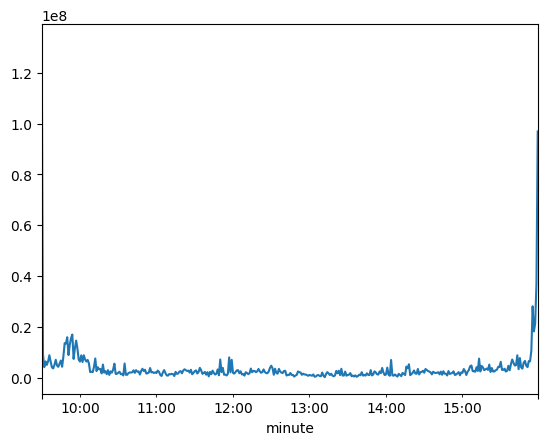

In [297]:
dollar_vol.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/3146005080.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


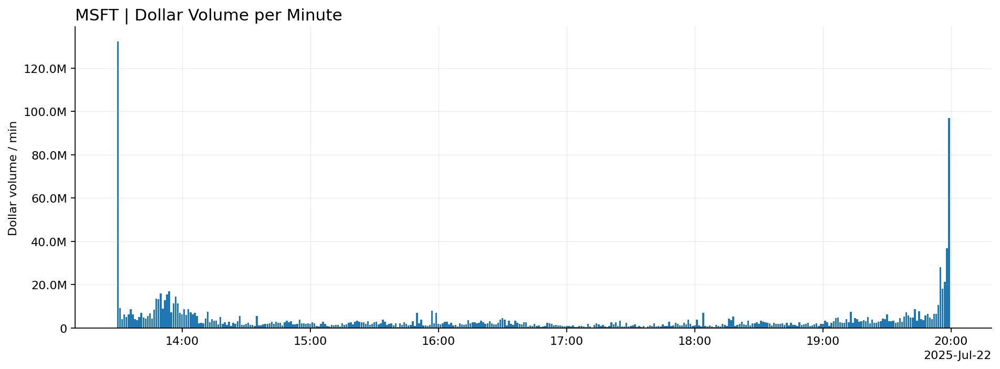

In [303]:
# AI generated for plot 
from matplotlib.ticker import FuncFormatter

s = dollar_vol.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=160)

# largeur de barre ≈ 85% du pas médian
step = np.median(np.diff(mdates.date2num(s.index.values))) if len(s)>1 else 1/1440
ax.bar(s.index, s.values, width=step*0.85, align="center")

# moyenne mobile (optionnelle)
# ma = s.rolling(10, min_periods=3).mean()
# ax.plot(ma.index, ma.values, linestyle="--", linewidth=1.6, label="MA10")

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.set_title("MSFT | Dollar Volume per Minute", loc="left", fontsize=14)
ax.set_ylabel("Dollar volume / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_dollar_vol_per_min.png', dpi=400)
plt.show()


## b. Number of trades and number of order / min

In [35]:
%time
g = lambda df, name: df.groupby('minute').size().rename(name)
n_trades = g(trades, 'n_trades')
n_orders_add = g(mbo[mbo['action'] == 'A'], 'n_orders_add')
n_orders_new = g(mbo[mbo['action'].isin(['A','F','R'])], 'n_orders_new')
n_cancel= g(mbo[mbo['action']=='C'], 'n_orders_cancel')
n_replace = g(mbo[mbo['action']=='R'], 'n_orders_replace')

res = pd.concat([n_trades, n_orders_new, n_orders_add, n_cancel, n_replace], axis=1).fillna(0)
display(res)

CPU times: user 2 μs, sys: 1e+03 ns, total: 3 μs
Wall time: 2.86 μs


,n_trades,n_orders_new,n_orders_add,n_orders_cancel,n_orders_replace
minute,,,,,
2025-07-22 09:30:00-04:00,1289,41448,40672,4441,0.0
2025-07-22 09:31:00-04:00,667,1852,1558,4896,0.0
2025-07-22 09:32:00-04:00,290,1188,1069,1106,0.0
2025-07-22 09:33:00-04:00,410,1508,1324,2915,0.0
2025-07-22 09:34:00-04:00,276,1285,1125,2868,0.0
...,...,...,...,...,...
2025-07-22 15:55:00-04:00,1741,10838,9574,9720,0.0
2025-07-22 15:56:00-04:00,1177,8150,7251,7371,0.0
2025-07-22 15:57:00-04:00,1330,13121,12101,8750,0.0


In [26]:
res.describe()

,n_trades,n_orders_new,n_orders_add,n_orders_cancel,n_orders_replace
count,390.000000,390.000000,390.000000,390.000000,390.0
mean,185.894872,1696.925641,1582.035897,1500.130769,0.0
std,257.467889,2669.653260,2541.040743,1504.550611,0.0
min,12.000000,341.000000,323.000000,319.000000,0.0
25%,86.250000,933.250000,867.250000,883.250000,0.0
50%,119.000000,1242.500000,1155.000000,1177.000000,0.0
75%,185.000000,1709.750000,1596.250000,1646.250000,0.0
max,3449.000000,41448.000000,40672.000000,21951.000000,0.0


In [311]:
print(res.describe().to_markdown())

|       |   n_trades |   n_orders_new |   n_orders_add |   n_orders_cancel |   n_orders_replace |
|:------|-----------:|---------------:|---------------:|------------------:|-------------------:|
| count |    390     |         390    |         390    |            390    |                390 |
| mean  |    185.895 |        1696.93 |        1582.04 |           1500.13 |                  0 |
| std   |    257.468 |        2669.65 |        2541.04 |           1504.55 |                  0 |
| min   |     12     |         341    |         323    |            319    |                  0 |
| 25%   |     86.25  |         933.25 |         867.25 |            883.25 |                  0 |
| 50%   |    119     |        1242.5  |        1155    |           1177    |                  0 |
| 75%   |    185     |        1709.75 |        1596.25 |           1646.25 |                  0 |
| max   |   3449     |       41448    |       40672    |          21951    |                  0 |


<Axes: xlabel='minute'>

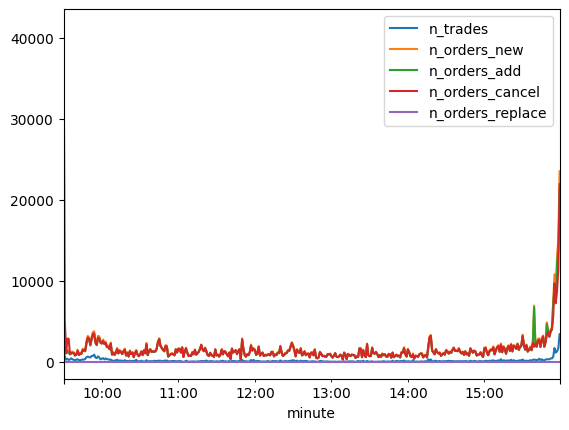

In [27]:
res.plot()

## c. OHLC / min

In [36]:
%time
ohlc = trades.resample('min', on='ts')['px'].ohlc()
display(ohlc)

CPU times: user 1 μs, sys: 0 ns, total: 1 μs
Wall time: 2.15 μs


,open,high,low,close
ts,,,,
2025-07-22 13:30:00+00:00,511.15,511.20,509.91,510.11
2025-07-22 13:31:00+00:00,510.04,510.44,509.40,509.48
2025-07-22 13:32:00+00:00,509.42,510.33,509.17,510.05
2025-07-22 13:33:00+00:00,510.05,510.47,509.82,509.93
2025-07-22 13:34:00+00:00,509.97,510.23,509.50,509.52
...,...,...,...,...
2025-07-22 19:55:00+00:00,505.69,505.88,505.30,505.75
2025-07-22 19:56:00+00:00,505.75,505.92,505.70,505.91
2025-07-22 19:57:00+00:00,505.90,506.26,505.88,506.11


<Axes: xlabel='ts'>

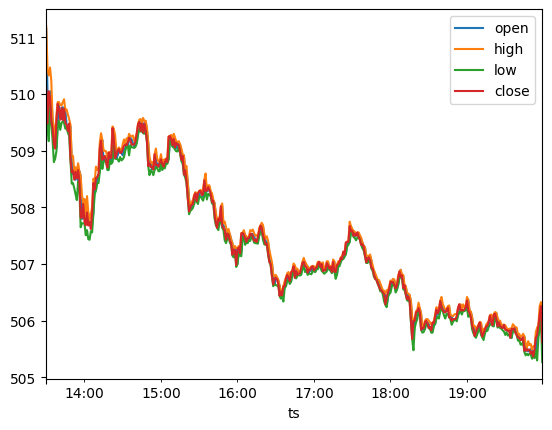

In [314]:
ohlc.plot()

In [324]:
import pandas as pd, mplfinance as mpf
ohlc = ohlc.copy(); ohlc.index = pd.to_datetime(ohlc.index)
mpf.plot(ohlc, type="candle", mav=20, style="yahoo",
         title="OHLC - MSFT — 1-min", ylabel="Price", figsize=(12,5), tight_layout=True, savefig="plot_rapport/ohlc_msft.png")


## d. VWAP

In [326]:
%time
vwap = trades.assign(px_sz=trades['px']*trades['size']).groupby(pd.Grouper(key='ts', freq='min'))[['px_sz','size']].sum().assign(vwap=lambda g: g['px_sz']/g['size'])['vwap']
display(vwap)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 3.81 μs


ts
2025-07-22 13:30:00+00:00    511.004587
2025-07-22 13:31:00+00:00    509.992394
2025-07-22 13:32:00+00:00    509.933853
2025-07-22 13:33:00+00:00    510.229913
2025-07-22 13:34:00+00:00    509.963532
                                ...    
2025-07-22 19:55:00+00:00    505.718148
2025-07-22 19:56:00+00:00    505.847465
2025-07-22 19:57:00+00:00    506.062238
2025-07-22 19:58:00+00:00    506.221666
2025-07-22 19:59:00+00:00    505.812011
Freq: min, Name: vwap, Length: 390, dtype: float64

<Axes: xlabel='ts'>

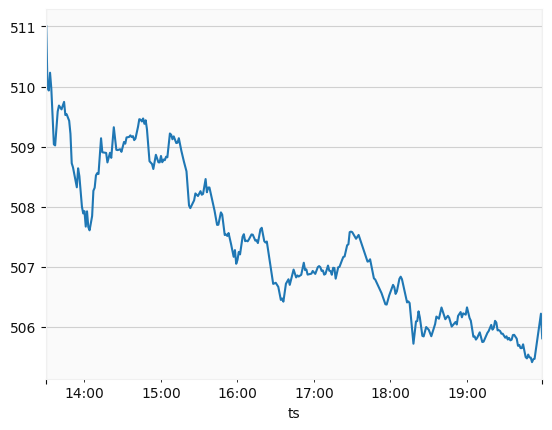

In [327]:
vwap.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/3790246182.py:35: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


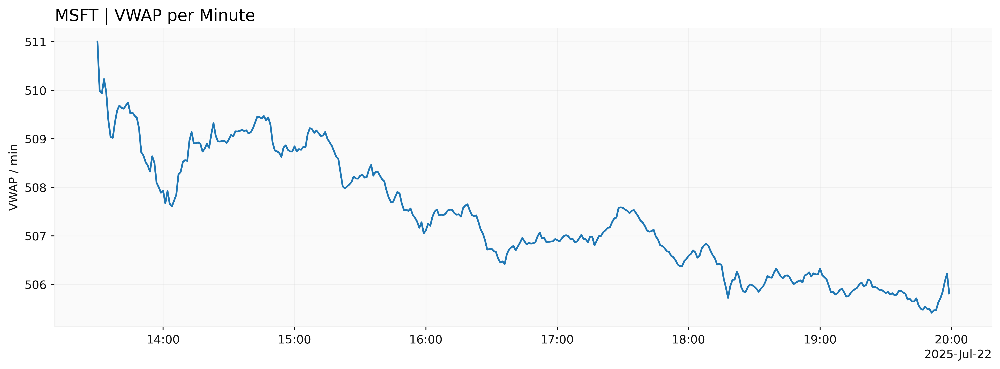

In [336]:
# AI generated for plot 
from matplotlib.ticker import FuncFormatter

s = vwap.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# largeur de barre ≈ 85% du pas médian
# step = np.median(np.diff(mdates.date2num(s.index.values))) if len(s)>1 else 1/1440
# ax.bar(s.index, s.values, width=step*0.85, align="center")

# moyenne mobile (optionnelle)
# ma = s.rolling(10, min_periods=3).mean()
# ax.plot(ma.index, ma.values, linestyle="--", linewidth=1.6, label="MA10")

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | VWAP per Minute", loc="left", fontsize=14)
ax.set_ylabel("VWAP / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_vwap_per_min.png', dpi=400)
plt.show()


## e. BBO Spread and depth per minute

In [45]:
def best(lvls, is_bid):
    ks = [p for p,q in lvls.items() if q > 0]
    if ks == []: 
        return (None, 0)
    p_best = max(ks) if is_bid else min(ks)
    return p_best, lvls[p_best]

In [243]:
%time
# We need to get the L2 / min representation of the LOB
orders = {}  # order_id -> (side, px, qty)
levels_bid = defaultdict(int)  # px -> total qty
levels_ask = defaultdict(int)
recs = []

current = mbo.minute.iloc[0]

for r in tqdm(mbo.itertuples(index=False), total=len(mbo)):
    act, oid, side, px, sz = r.action, int(r.order_id), r.side, float(r.px), int(r.size)

    if  r.minute > current: 
        bb, bq = best(levels_bid, True)
        ba, aq = best(levels_ask, False)
        spread = ba - bb
        for p,q in levels_ask.items():
            if q > 0:
                recs.append((r.minute, 'A', p, q, bb, ba, bq, aq, spread))
        for p,q in levels_bid.items():
            if q > 0:
                recs.append((r.minute, 'B', p, q, bb, ba, bq, aq, spread))
        current = r.minute

    if act in ('A','F'):  # Add
        if oid in orders:
            s_old, p_old, q_old = orders.pop(oid)
            (levels_bid if s_old=='B' else levels_ask)[p_old] -= q_old
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    elif act == 'C':      # Cancel (réduction)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            dq = min(sz, q_old)
            q_new = q_old - dq
            if s_old=='B': 
                levels_bid[p_old] -= dq
            else:          
                levels_ask[p_old] -= dq
            if q_new > 0:
                orders[oid] = (s_old, p_old, q_new)
            else:
                orders.pop(oid, None)

    elif act == 'R':      # Replace (price and/or qty)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            # get rid of the previous
            if s_old=='B': 
                levels_bid[p_old] -= q_old
            else:          
                levels_ask[p_old] -= q_old
        # save the new (px, sz)
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    # 'T' (print) n'affecte pas le carnet ici; la diminution liée aux exécutions passe via 'C'


l2 = pd.DataFrame(recs, columns=['ts','side','price','depth','best_bid','best_ask','best_bid_depth','best_ask_depth','spread'])
l2['rel_spread'] = l2['spread'] / ((l2['best_bid'] + l2['best_ask'])/2)
l2['mid_price'] = (l2['best_bid'] + l2['best_ask'])/2

CPU times: user 2 μs, sys: 0 ns, total: 2 μs
Wall time: 3.1 μs


100%|██████████| 1319351/1319351 [00:07<00:00, 178027.19it/s]


In [244]:
l2.set_index('ts', inplace=True)
display(l2)

,side,price,depth,best_bid,best_ask,best_bid_depth,best_ask_depth,spread,rel_spread,mid_price
ts,,,,,,,,,,
2025-07-22 09:31:00-04:00,A,523.84,100,510.04,510.22,11,2,0.18,0.000353,510.13
2025-07-22 09:31:00-04:00,A,511.95,108,510.04,510.22,11,2,0.18,0.000353,510.13
2025-07-22 09:31:00-04:00,A,522.42,200,510.04,510.22,11,2,0.18,0.000353,510.13
2025-07-22 09:31:00-04:00,A,521.42,105,510.04,510.22,11,2,0.18,0.000353,510.13
2025-07-22 09:31:00-04:00,A,536.76,200,510.04,510.22,11,2,0.18,0.000353,510.13
...,...,...,...,...,...,...,...,...,...,...
2025-07-22 15:59:00-04:00,B,254.72,20,506.25,506.27,106,713,0.02,0.000040,506.26
2025-07-22 15:59:00-04:00,B,348.07,1,506.25,506.27,106,713,0.02,0.000040,506.26
2025-07-22 15:59:00-04:00,B,395.95,1,506.25,506.27,106,713,0.02,0.000040,506.26


<Axes: xlabel='ts'>

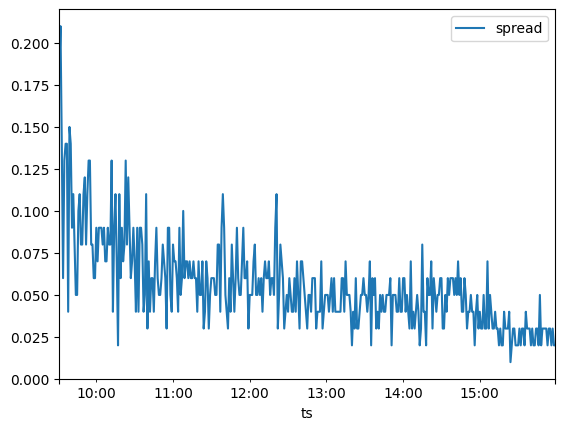

In [245]:
l2[['spread']].reset_index().groupby('ts').last().plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/3005002127.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


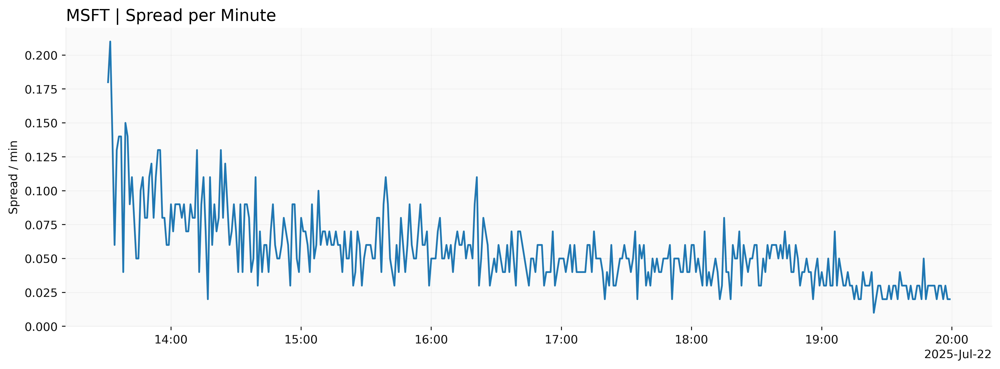

In [361]:
# AI generated for plot 
s = l2[['spread']].reset_index().groupby('ts').last().copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | Spread per Minute", loc="left", fontsize=14)
ax.set_ylabel("Spread / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_Spread_per_min.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

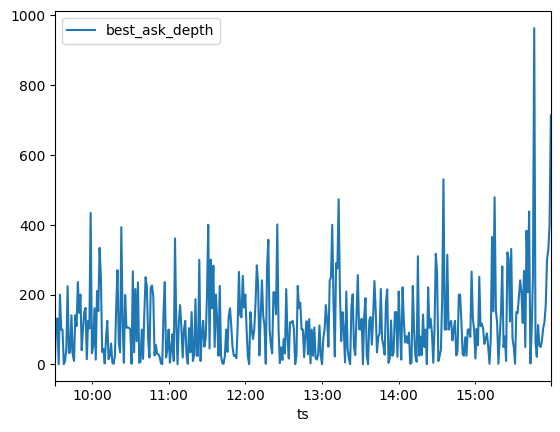

In [251]:
l2[['best_ask_depth']].reset_index().groupby('ts').last().plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/3133422716.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


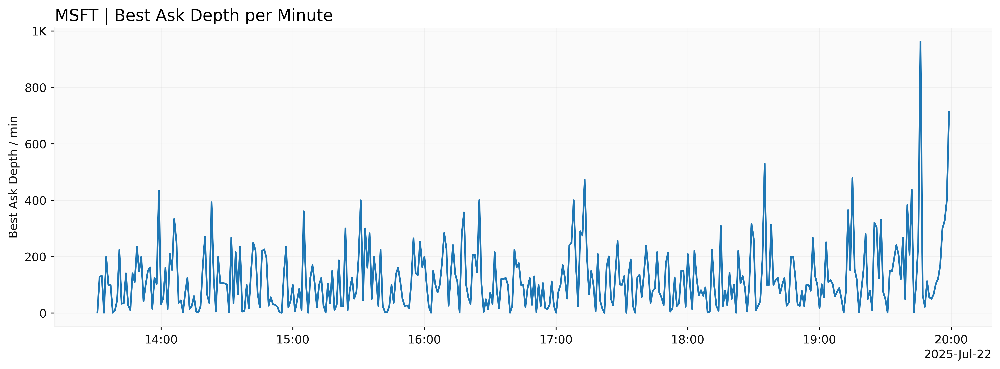

In [341]:
# AI generated for plot 
s = l2[['best_ask_depth']].reset_index().groupby('ts').last().copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | Best Ask Depth per Minute", loc="left", fontsize=14)
ax.set_ylabel("Best Ask Depth / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_best_ask_spread_per_min.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

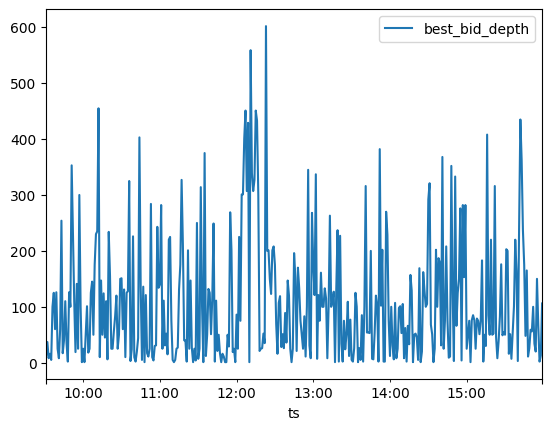

In [252]:
l2[['best_bid_depth']].reset_index().groupby('ts').last().plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/433180410.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


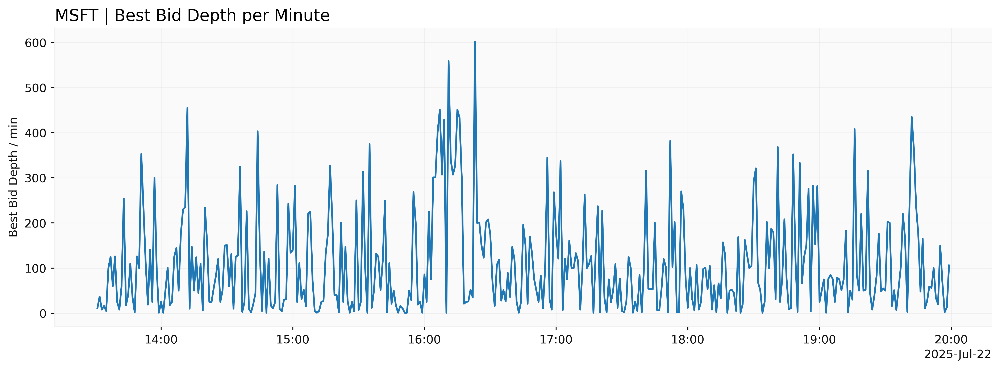

In [342]:
# AI generated for plot 
s = l2[['best_bid_depth']].reset_index().groupby('ts').last().copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | Best Bid Depth per Minute", loc="left", fontsize=14)
ax.set_ylabel("Best Bid Depth / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_best_bid_spread_per_min.png', dpi=400)
plt.show()

## f. Depth at twice the day's average spread

In [61]:
%time
day_avg_spread = l2.spread.mean()
print(f'the day avg spread is :{day_avg_spread}')

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.86 μs
the day avg spread is :0.055373195483743115


In [63]:
%time
troncated_l2 = l2[((l2.side == "A") & (l2.price < l2.mid_price + day_avg_spread)) | ((l2.side == "B") & (l2.price > l2.mid_price - day_avg_spread))]
display(troncated_l2)

CPU times: user 1 μs, sys: 0 ns, total: 1 μs
Wall time: 1.91 μs


,side,price,depth,best_bid,best_ask,best_bid_depth,best_ask_depth,spread,rel_spread,mid_price
ts,,,,,,,,,,
2025-07-22 09:34:00-04:00,A,509.97,1,509.91,509.97,16,1,0.06,0.000118,509.94
2025-07-22 09:34:00-04:00,B,509.91,16,509.91,509.97,16,1,0.06,0.000118,509.94
2025-07-22 09:38:00-04:00,A,509.06,1,509.02,509.06,60,1,0.04,0.000079,509.04
2025-07-22 09:38:00-04:00,B,509.01,7,509.02,509.06,60,1,0.04,0.000079,509.04
2025-07-22 09:38:00-04:00,B,509.02,60,509.02,509.06,60,1,0.04,0.000079,509.04
...,...,...,...,...,...,...,...,...,...,...
2025-07-22 15:59:00-04:00,B,506.25,106,506.25,506.27,106,713,0.02,0.000040,506.26
2025-07-22 15:59:00-04:00,B,506.21,360,506.25,506.27,106,713,0.02,0.000040,506.26
2025-07-22 15:59:00-04:00,B,506.22,160,506.25,506.27,106,713,0.02,0.000040,506.26


In [70]:
%time
depth = troncated_l2.groupby(['ts','side'], observed=True)['depth'].sum()      

# Build the full grid (all minutes × both sides)
ts_idx = depth.index.get_level_values(0)           
tz = getattr(ts_idx[0], 'tz', None)

start = ts_idx.min().floor('min')
end = ts_idx.max().ceil('min')
all_ts = pd.date_range(start, end, freq='min', tz=tz)

full_idx = pd.MultiIndex.from_product([all_ts, ['A','B']], names=['ts','side'])

# reindex and fill with 0
depth_full = depth.reindex(full_idx, fill_value=0).reset_index()
display(depth_full)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 4.05 μs


,ts,side,depth
0,2025-07-22 09:34:00-04:00,A,1
1,2025-07-22 09:34:00-04:00,B,16
2,2025-07-22 09:35:00-04:00,A,0
3,2025-07-22 09:35:00-04:00,B,0
4,2025-07-22 09:36:00-04:00,A,0
...,...,...,...
767,2025-07-22 15:57:00-04:00,B,1482
768,2025-07-22 15:58:00-04:00,A,1162
769,2025-07-22 15:58:00-04:00,B,746
770,2025-07-22 15:59:00-04:00,A,1718


<Axes: >

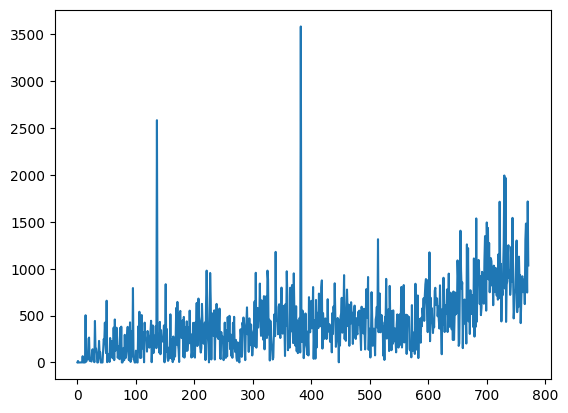

In [69]:
depth_full['depth'].plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/1072025501.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


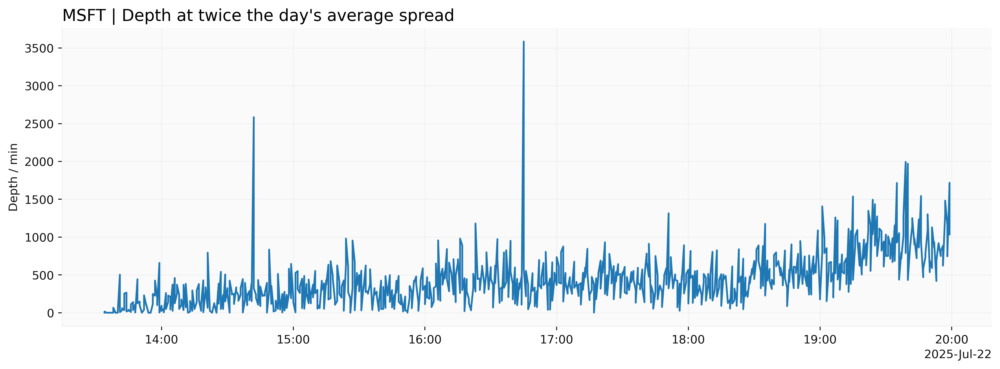

In [362]:
# AI generated for plot 
s = depth_full[['depth','ts']].set_index('ts').copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | Depth at twice the day's average spread", loc="left", fontsize=14)
ax.set_ylabel("Depth / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_depth_twice_avg_spread.png', dpi=400)
plt.show()

## g. Price impact 

In [378]:
# We need a sec/sec l2
%time
orders = {}  # order_id -> (side, px, qty)
levels_bid = defaultdict(int)  # px -> total qty
levels_ask = defaultdict(int)
recs = []

mbo['seconde'] = mbo['ts'].dt.floor('s')
current = mbo.seconde.iloc[0]

for r in tqdm(mbo.itertuples(index=False), total=len(mbo)):
    act, oid, side, px, sz = r.action, int(r.order_id), r.side, float(r.px), int(r.size)

    # Snapshot each seconds
    if  r.seconde > current: 
        bb, bq = best(levels_bid, True)
        ba, aq = best(levels_ask, False)
        spread = ba - bb
        for p,q in levels_ask.items():
            if q > 0:
                recs.append((r.seconde, 'A', p, q, bb, ba, bq, aq, spread))
        for p,q in levels_bid.items():
            if q > 0:
                recs.append((r.seconde, 'B', p, q, bb, ba, bq, aq, spread))
        current = r.seconde

    if act in ('A','F'):  # Add
        if oid in orders:
            s_old, p_old, q_old = orders.pop(oid)
            (levels_bid if s_old=='B' else levels_ask)[p_old] -= q_old
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    elif act == 'C':      # Cancel (réduction)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            dq = min(sz, q_old)
            q_new = q_old - dq
            if s_old=='B': 
                levels_bid[p_old] -= dq
            else:          
                levels_ask[p_old] -= dq
            if q_new > 0:
                orders[oid] = (s_old, p_old, q_new)
            else:
                orders.pop(oid, None)

    elif act == 'R':      # Replace (price and/or qty)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            # get rid of the previous
            if s_old=='B': 
                levels_bid[p_old] -= q_old
            else:          
                levels_ask[p_old] -= q_old
        # save the new (px, sz)
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    # 'T' (print) n'affecte pas le carnet ici; la diminution liée aux exécutions passe via 'C'


l2 = pd.DataFrame(recs, columns=['ts','side','price','depth','best_bid','best_ask','best_bid_depth','best_ask_depth','spread'])
l2['rel_spread'] = l2['spread'] / ((l2['best_bid'] + l2['best_ask'])/2)
l2['mid_price'] = (l2['best_bid'] + l2['best_ask'])/2

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 3.1 μs


100%|██████████| 1319351/1319351 [01:24<00:00, 15557.08it/s] 


In [402]:
%time
tr = trades.loc[trades['side'].isin(['A','B']), ['ts','side']].copy()
tr = tr.sort_values('ts')
tr['sign'] = tr['side'].map({'B': +1, 'A': -1}).astype(int)

mids = (l2[['ts','mid_price']]
        .drop_duplicates('ts', keep='last')
        .sort_values('ts'))
tr = (pd.merge_asof(tr, mids, on='ts', direction='backward')
        .rename(columns={'mid_price':'mid0'}))

tr['ts_h'] = tr['ts'] + pd.Timedelta(seconds=5)
mids_h = mids.rename(columns={'ts':'ts_h', 'mid_price':'mid5'})
tr = pd.merge_asof(tr.sort_values('ts_h'), mids_h, on='ts_h', direction='backward')

tr = tr.dropna(subset=['mid0','mid5'])
tr['log_r_5s'] = np.log(tr['mid5'] / tr['mid0'])
tr['minute']   = tr['ts'].dt.floor('min')

def ols_beta(g):
    x = g['sign'].to_numpy(float)
    y = g['log_r_5s'].to_numpy(float)
    if x.size < 2 or np.var(x) == 0:
        return pd.Series({'alpha': np.nan, 'beta_5s': np.nan, 'n': x.size})
    X = np.column_stack([np.ones_like(x), x])
    alpha, beta = np.linalg.lstsq(X, y, rcond=None)[0]
    return pd.Series({'alpha': alpha, 'beta_5s': beta, 'n': x.size})

price_impact = (tr.groupby('minute', observed=True)
                  .apply(ols_beta)
                  .reset_index())


CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.86 μs


/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2523090814.py:30: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(ols_beta)


<Axes: >

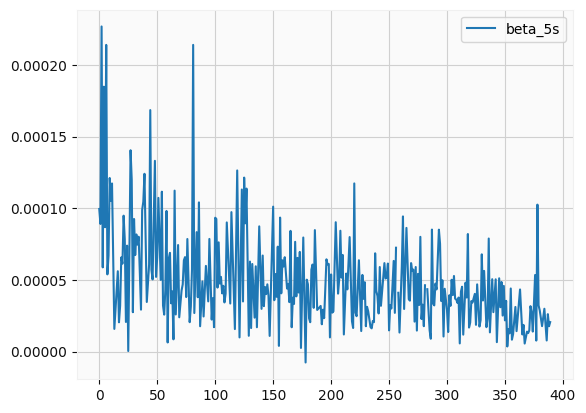

In [403]:
price_impact[['beta_5s']].plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/4104457615.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


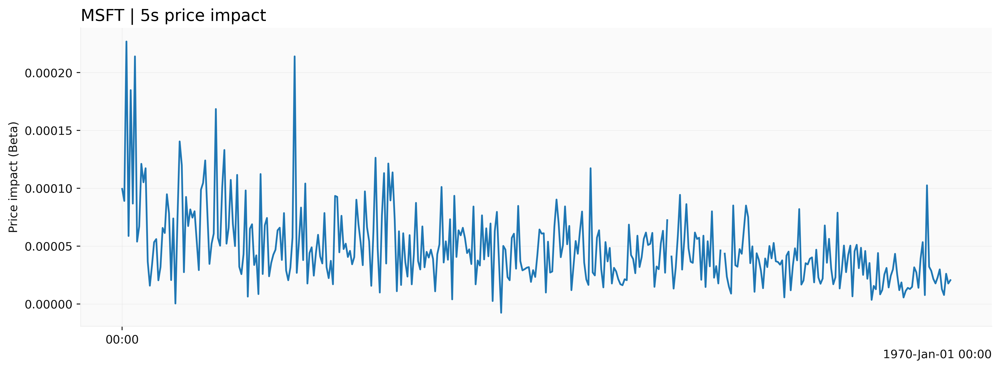

In [400]:
# AI generated for plot 
s = price_impact[['beta_5s']].copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | 5s price impact", loc="left", fontsize=14)
ax.set_ylabel("Price impact (Beta)")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_price_impact.png', dpi=400)
plt.show()

## h. 1 min midquote and transaction price

In [153]:
mid_1s = l2[['ts','mid_price']].groupby('ts').last()['mid_price']
mid_1m = l2[['ts','mid_price']].groupby('ts').last()['mid_price'].resample('1min', label='left', closed='left').last().ffill()

<Axes: xlabel='ts'>

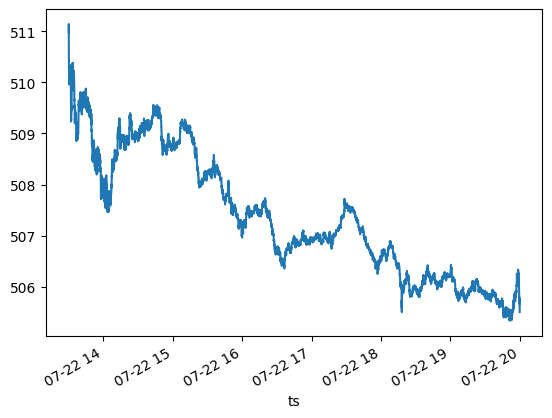

In [154]:
mid_1s.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2673888109.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


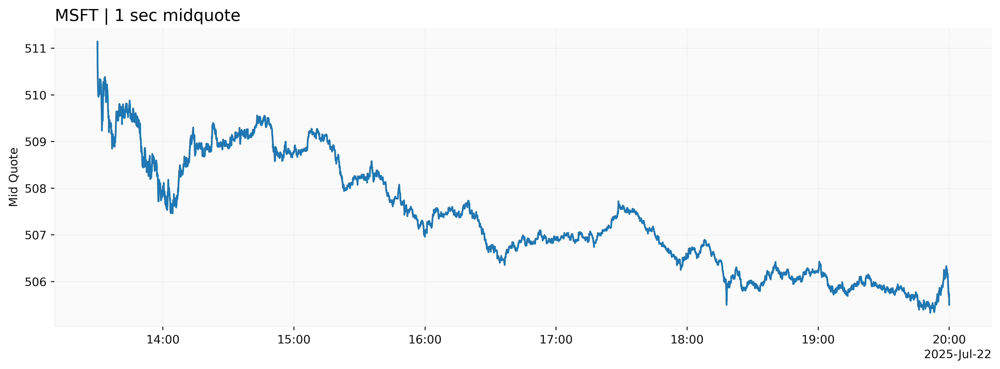

In [366]:
# AI generated for plot 
s = mid_1s.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | 1 sec midquote", loc="left", fontsize=14)
ax.set_ylabel("Mid Quote")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_mid.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

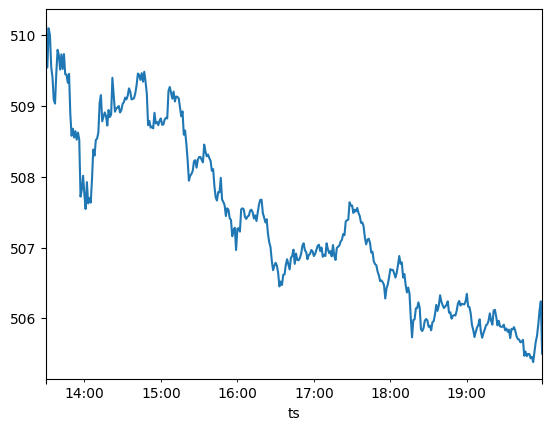

In [156]:
mid_1m.plot()

In [163]:
%time
trades = mbo[mbo.action == 'T'].copy()
px_1s  = trades.set_index('ts')['px'].resample('1s', label='left', closed='left').last() 
px_1min = trades.set_index('ts')['px'].resample('1min', label='left', closed='left').last() 

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 2.15 μs


<Axes: xlabel='ts'>

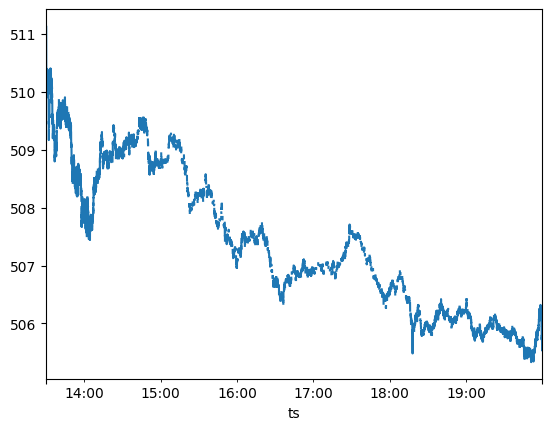

In [164]:
px_1s.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/129281017.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


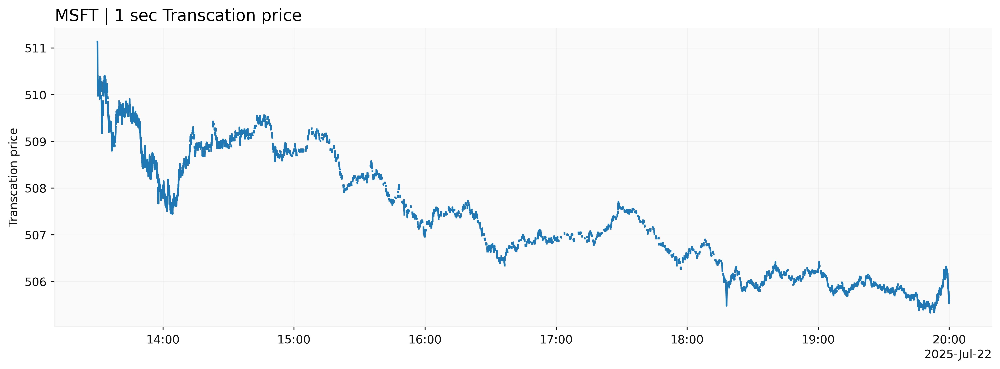

In [367]:
# AI generated for plot 
s = px_1s.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | 1 sec Transcation price", loc="left", fontsize=14)
ax.set_ylabel("Transcation price")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_px.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

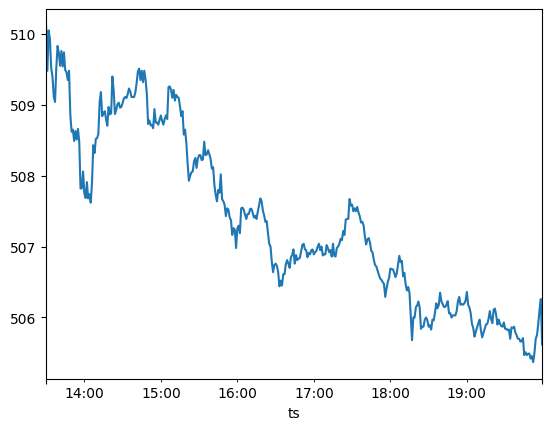

In [165]:
px_1min.plot()

## i. Mid and transcation log Returns

In [176]:
%time
ret_mid_1s = np.log(mid_1s.shift()/mid_1s).dropna() 
ret_mid_1m = np.log(mid_1m.shift()/mid_1m).dropna() 

CPU times: user 2 μs, sys: 1 μs, total: 3 μs
Wall time: 3.1 μs


<Axes: xlabel='ts'>

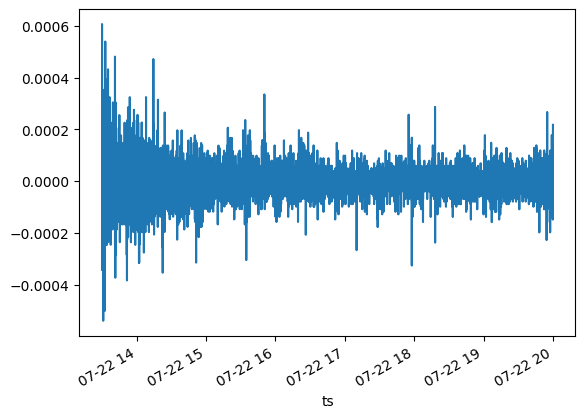

In [177]:
ret_mid_1s.plot()

<Axes: xlabel='ts'>

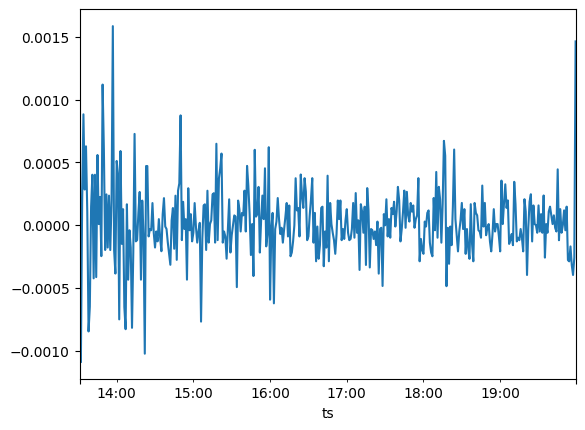

In [178]:
ret_mid_1m.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/4020029972.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


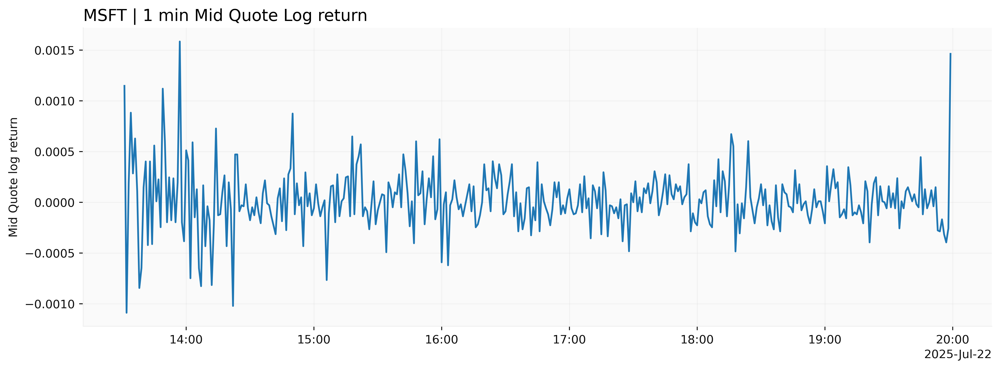

In [375]:
# AI generated for plot 
s = ret_mid_1m.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | 1 min Mid Quote Log return", loc="left", fontsize=14)
ax.set_ylabel("Mid Quote log return")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_mid_return.png', dpi=400)
plt.show()

In [179]:
%time
ret_px_1m = np.log(px_1min.shift()/px_1min)
ret_px_1s = np.log(px_1s.shift()/px_1s)

CPU times: user 2 μs, sys: 1e+03 ns, total: 3 μs
Wall time: 5.96 μs


<Axes: xlabel='ts'>

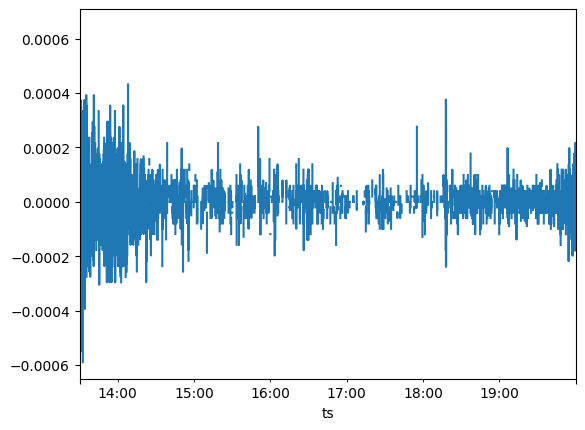

In [181]:
ret_px_1s.plot()

<Axes: xlabel='ts'>

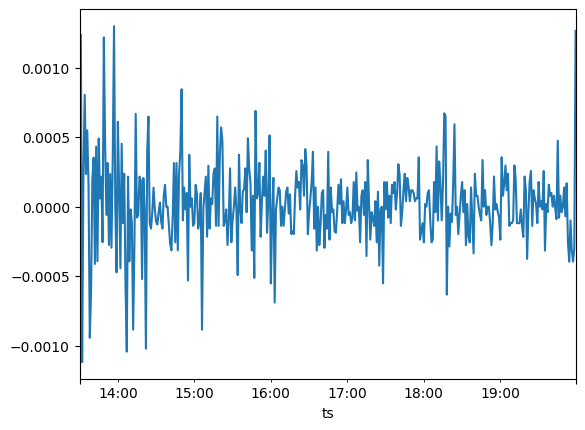

In [180]:
ret_px_1m.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2133442429.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


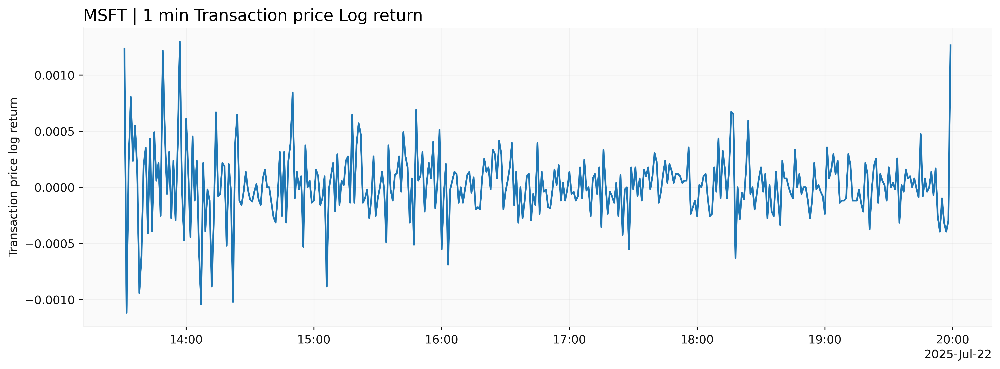

In [374]:
# AI generated for plot 
s = ret_px_1m.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("MSFT | 1 min Transaction price Log return", loc="left", fontsize=14)
ax.set_ylabel("Transaction price log return")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/MSFT_px_return.png', dpi=400)
plt.show()

## j. Realized variance

In [182]:
print(f'The realized variance for the midquotes is {np.pow(ret_mid_1m,2).sum()}')
print(f'The realized variance for the transaction prices is {np.pow(ret_px_1m,2).sum()}')

The realized variance for the midquotes is 3.42943925649721e-05
The realized variance for the transaction prices is 3.461225455042552e-05


## k. ACF

In [185]:
def safe_ljungbox(s, lags=[1,5,10]):
    s = pd.Series(s).dropna()
    if len(s) <= max(lags):
        return pd.DataFrame({
            'lb_stat':   [np.nan]*len(lags),
            'lb_pvalue': [np.nan]*len(lags),
            'bp_stat':   [np.nan]*len(lags),
            'bp_pvalue': [np.nan]*len(lags),
        }, index=lags)
    return acorr_ljungbox(s, lags=lags, return_df=True, boxpierce=True)

def safe_acf(s, nlags=10):
    s = pd.Series(s).dropna()
    if len(s) <= nlags:
        return np.array([np.nan]*(nlags+1))
    return acf(s.values, nlags=nlags) 

In [191]:
# created with AI
import matplotlib.dates as mdates
def apply_timeseries_style(ax, title: str, ylabel: str):
    ax.set_title(title, loc="left", fontsize=12, fontweight="bold")
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.25)
    # ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    # ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))
    for spine in ["top","right"]:
        ax.spines[spine].set_visible(False)
    return ax

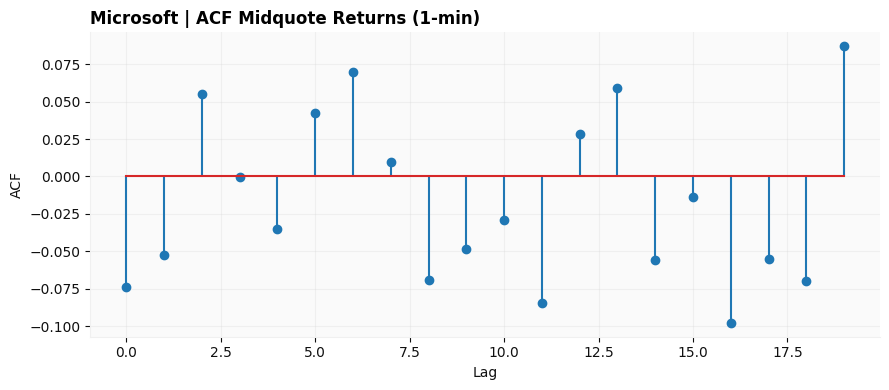

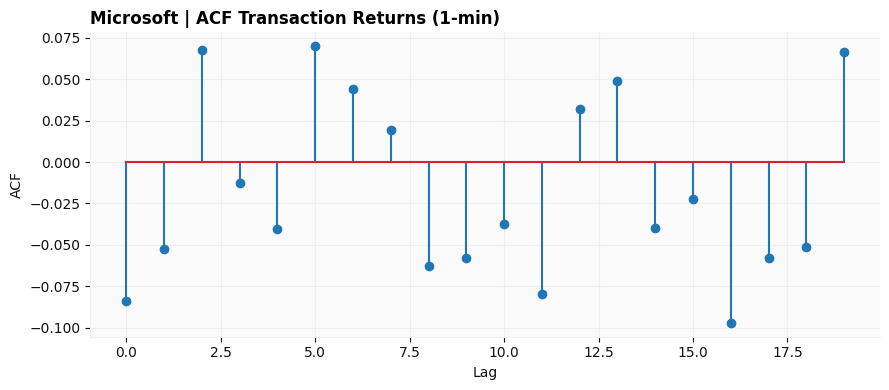

In [409]:
ac_mid = safe_acf(ret_mid_1m, nlags=20)[1:]
ac_px  = safe_acf(ret_px_1m,  nlags=20)[1:]

# Midquote
fig, ax = plt.subplots(figsize=(9,4))
ax.stem(range(len(ac_mid)), ac_mid)
apply_timeseries_style(ax, "Microsoft | ACF Midquote Returns (1-min)", "ACF")
ax.set_xlabel("Lag")
plt.tight_layout()
plt.savefig('plot_rapport/MSFT_acf_mid.png', dpi=300)

# Transaction
fig, ax = plt.subplots(figsize=(9,4))
ax.stem(range(len(ac_px)), ac_px)
apply_timeseries_style(ax, "Microsoft | ACF Transaction Returns (1-min)", "ACF")
ax.set_xlabel("Lag")
plt.tight_layout()
plt.savefig('plot_rapport/MSFT_acf_px.png', dpi=300)

# Quantum computing

In [219]:
df = pd.read_csv('data/Quantum_MBO/quantum_trades.csv')
display(df)

,ts_recv,ts_event,rtype,publisher_id,instrument_id,action,side,price,size,channel_id,order_id,flags,ts_in_delta,sequence,symbol
0,2025-07-30T07:05:11.057459467Z,2025-07-30T07:05:11.057293980Z,160,2,13391,R,N,NaN,0,0,0,8,0,0,QUBT
1,2025-07-30T08:00:00.116823241Z,2025-07-30T08:00:00.116652285Z,160,2,13391,A,A,15.45,34,0,8743,130,170956,291673,QUBT
2,2025-07-30T08:00:00.117355645Z,2025-07-30T08:00:00.117187070Z,160,2,13391,A,A,15.51,75,0,9299,128,168575,291980,QUBT
3,2025-07-30T08:00:00.121411577Z,2025-07-30T08:00:00.121246156Z,160,2,13391,C,A,15.45,34,0,8743,130,165421,292934,QUBT
4,2025-07-30T08:00:00.161597954Z,2025-07-30T08:00:00.161432885Z,160,2,13391,C,A,15.51,75,0,9299,130,165069,295387,QUBT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
572685,2025-07-30T23:59:23.086859608Z,2025-07-30T23:59:23.086694478Z,160,2,13391,C,B,15.59,1,0,980764799,130,165130,652976527,QUBT
572686,2025-07-30T23:59:23.088368064Z,2025-07-30T23:59:23.088202991Z,160,2,13391,A,B,15.62,1,0,980784347,130,165073,652976528,QUBT
572687,2025-07-30T23:59:23.962168864Z,2025-07-30T23:59:23.962003979Z,160,2,13391,C,B,15.63,11,0,980784275,130,164885,652978641,QUBT
572688,2025-07-30T23:59:26.338954974Z,2025-07-30T23:59:26.338789682Z,160,2,13391,A,A,15.67,1,0,980786283,130,165292,652979337,QUBT


In [221]:
mbo_q = prepare_session(df, symbol='QUBT', session_date='2025-07-30', conversion=False)
display(mbo_q.head(5))

,ts_recv,ts_event,rtype,publisher_id,instrument_id,action,side,price,size,channel_id,order_id,flags,ts_in_delta,sequence,symbol,ts,ts_et,minute,px
12005,2025-07-30T13:30:00.309653590Z,2025-07-30T13:30:00.309482921Z,160,2,13391,F,B,15.3,4,0,11159163,0,170669,27816295,QUBT,2025-07-30 13:30:00.309482921+00:00,2025-07-30 09:30:00.309482921-04:00,2025-07-30 09:30:00-04:00,15.3
12006,2025-07-30T13:30:00.309653590Z,2025-07-30T13:30:00.309482921Z,160,2,13391,C,B,15.3,4,0,11159163,0,170669,27816295,QUBT,2025-07-30 13:30:00.309482921+00:00,2025-07-30 09:30:00.309482921-04:00,2025-07-30 09:30:00-04:00,15.3
12007,2025-07-30T13:30:00.309653590Z,2025-07-30T13:30:00.309482921Z,160,2,13391,F,B,15.3,1,0,13736591,0,170669,27816296,QUBT,2025-07-30 13:30:00.309482921+00:00,2025-07-30 09:30:00.309482921-04:00,2025-07-30 09:30:00-04:00,15.3
12008,2025-07-30T13:30:00.309653590Z,2025-07-30T13:30:00.309482921Z,160,2,13391,C,B,15.3,1,0,13736591,0,170669,27816296,QUBT,2025-07-30 13:30:00.309482921+00:00,2025-07-30 09:30:00.309482921-04:00,2025-07-30 09:30:00-04:00,15.3
12009,2025-07-30T13:30:00.309653590Z,2025-07-30T13:30:00.309482921Z,160,2,13391,F,B,15.3,1,0,14681919,0,170669,27816297,QUBT,2025-07-30 13:30:00.309482921+00:00,2025-07-30 09:30:00.309482921-04:00,2025-07-30 09:30:00-04:00,15.3


## a. Dollar per minute

In [222]:
%time
trades_q = mbo_q[mbo_q.action == 'T'].copy()
trades_q['dollar'] = trades_q['px'] * trades_q['size']
dollar_vol_q = (trades_q.groupby('minute')['dollar'].sum().rename('dollar_vol'))
display(dollar_vol_q)

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 4.05 μs


minute
2025-07-30 09:30:00-04:00    1856397.700
2025-07-30 09:31:00-04:00     118933.250
2025-07-30 09:32:00-04:00     181341.330
2025-07-30 09:33:00-04:00     299632.420
2025-07-30 09:34:00-04:00     118819.040
                                ...     
2025-07-30 15:55:00-04:00     395579.945
2025-07-30 15:56:00-04:00     392856.340
2025-07-30 15:57:00-04:00     623967.590
2025-07-30 15:58:00-04:00     453343.125
2025-07-30 15:59:00-04:00    1208024.275
Name: dollar_vol, Length: 388, dtype: float64

<Axes: xlabel='minute'>

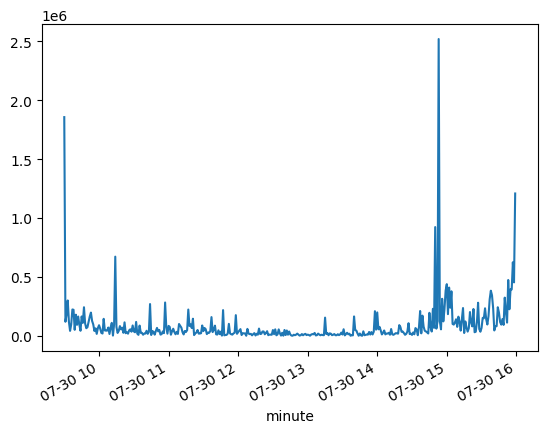

In [304]:
dollar_vol_q.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/306577070.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


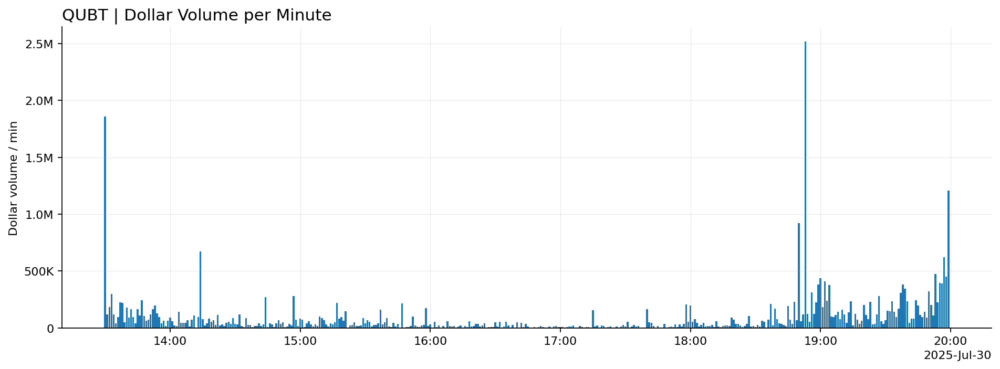

In [305]:
# AI generated for plot 
from matplotlib.ticker import FuncFormatter

s = dollar_vol_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=160)

# largeur de barre ≈ 85% du pas médian
step = np.median(np.diff(mdates.date2num(s.index.values))) if len(s)>1 else 1/1440
ax.bar(s.index, s.values, width=step*0.85, align="center")

# moyenne mobile (optionnelle)
# ma = s.rolling(10, min_periods=3).mean()
# ax.plot(ma.index, ma.values, linestyle="--", linewidth=1.6, label="MA10")

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.set_title("QUBT | Dollar Volume per Minute", loc="left", fontsize=14)
ax.set_ylabel("Dollar volume / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_dollar_vol_per_min.png', dpi=400)
plt.show()

## b. Number of trades and number of order / min

In [224]:
%time
g = lambda df, name: df.groupby('minute').size().rename(name)
n_trades = g(trades_q, 'n_trades')
n_orders_add = g(mbo_q[mbo_q['action'] == 'A'], 'n_orders_add')
n_orders_new = g(mbo_q[mbo_q['action'].isin(['A','F','R'])], 'n_orders_new')
n_cancel= g(mbo_q[mbo_q['action']=='C'], 'n_orders_cancel')
n_replace = g(mbo_q[mbo_q['action']=='R'], 'n_orders_replace')

res_q = pd.concat([n_trades, n_orders_new, n_orders_add, n_cancel, n_replace], axis=1).fillna(0)
display(res_q)

CPU times: user 2 μs, sys: 0 ns, total: 2 μs
Wall time: 3.1 μs


,n_trades,n_orders_new,n_orders_add,n_orders_cancel,n_orders_replace
minute,,,,,
2025-07-30 09:30:00-04:00,183.0,11621,11440,1670,0.0
2025-07-30 09:31:00-04:00,96.0,532,452,1528,0.0
2025-07-30 09:32:00-04:00,103.0,594,509,510,0.0
2025-07-30 09:33:00-04:00,86.0,599,533,1053,0.0
2025-07-30 09:34:00-04:00,64.0,639,586,579,0.0
...,...,...,...,...,...
2025-07-30 15:55:00-04:00,149.0,1509,1406,782,0.0
2025-07-30 15:56:00-04:00,175.0,1187,1062,782,0.0
2025-07-30 15:57:00-04:00,174.0,2055,1954,632,0.0


In [225]:
res_q.describe()

,n_trades,n_orders_new,n_orders_add,n_orders_cancel,n_orders_replace
count,390.000000,390.000000,390.000000,390.000000,390.0
mean,40.853846,694.900000,661.912821,639.000000,0.0
std,73.436587,775.108685,747.158365,517.802222,0.0
min,0.000000,17.000000,17.000000,12.000000,0.0
25%,13.000000,313.750000,303.750000,307.250000,0.0
50%,25.000000,520.500000,496.500000,503.000000,0.0
75%,46.750000,816.750000,775.500000,785.000000,0.0
max,1232.000000,11621.000000,11440.000000,3257.000000,0.0


<Axes: xlabel='minute'>

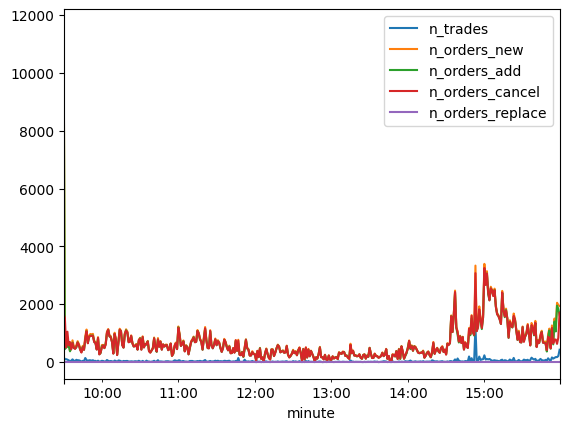

In [226]:
res_q.plot()

## c. OHLC / min

In [227]:
%time
ohlc_q = trades_q.resample('min', on='ts')['px'].ohlc()
display(ohlc_q)

CPU times: user 2 μs, sys: 1e+03 ns, total: 3 μs
Wall time: 4.05 μs


,open,high,low,close
ts,,,,
2025-07-30 13:30:00+00:00,15.300,15.470,15.270,15.400
2025-07-30 13:31:00+00:00,15.375,15.410,15.340,15.365
2025-07-30 13:32:00+00:00,15.360,15.420,15.330,15.350
2025-07-30 13:33:00+00:00,15.360,15.570,15.360,15.555
2025-07-30 13:34:00+00:00,15.565,15.580,15.480,15.500
...,...,...,...,...
2025-07-30 19:55:00+00:00,14.665,14.685,14.650,14.685
2025-07-30 19:56:00+00:00,14.680,14.695,14.655,14.685
2025-07-30 19:57:00+00:00,14.690,14.740,14.685,14.735


In [323]:
import pandas as pd, mplfinance as mpf
ohlc_q = ohlc_q.copy(); ohlc_q.index = pd.to_datetime(ohlc_q.index)
mpf.plot(ohlc_q, type="candle", mav=20, style="yahoo",
         title="OHLC - QUBT — 1-min", ylabel="Price", figsize=(12,5), tight_layout=True, savefig="plot_rapport/ohlc_qubt.png")


## d. VWAP

In [228]:
%time
vwap_q = trades_q.assign(px_sz=trades_q['px']*trades_q['size']).groupby(pd.Grouper(key='ts', freq='min'))[['px_sz','size']].sum().assign(vwap=lambda g: g['px_sz']/g['size'])['vwap']
display(vwap_q)

CPU times: user 2 μs, sys: 1e+03 ns, total: 3 μs
Wall time: 4.05 μs


ts
2025-07-30 13:30:00+00:00    15.319720
2025-07-30 13:31:00+00:00    15.372011
2025-07-30 13:32:00+00:00    15.371817
2025-07-30 13:33:00+00:00    15.495290
2025-07-30 13:34:00+00:00    15.544092
                               ...    
2025-07-30 19:55:00+00:00    14.668494
2025-07-30 19:56:00+00:00    14.677988
2025-07-30 19:57:00+00:00    14.704772
2025-07-30 19:58:00+00:00    14.725626
2025-07-30 19:59:00+00:00    14.723385
Freq: min, Name: vwap, Length: 390, dtype: float64

<Axes: xlabel='ts'>

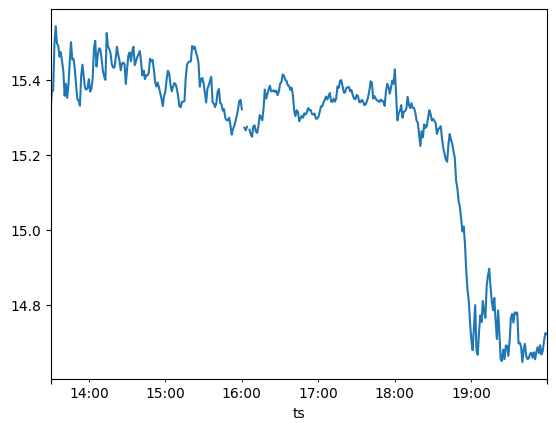

In [229]:
vwap_q.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2095024648.py:35: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


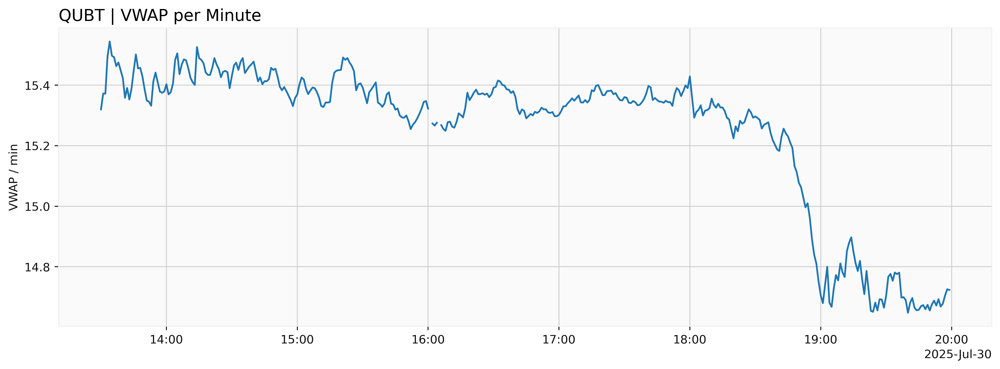

In [353]:
# AI generated for plot 
from matplotlib.ticker import FuncFormatter

s = vwap_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# largeur de barre ≈ 85% du pas médian
# step = np.median(np.diff(mdates.date2num(s.index.values))) if len(s)>1 else 1/1440
# ax.bar(s.index, s.values, width=step*0.85, align="center")

# moyenne mobile (optionnelle)
# ma = s.rolling(10, min_periods=3).mean()
# ax.plot(ma.index, ma.values, linestyle="--", linewidth=1.6, label="MA10")

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
# ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
# ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
# ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | VWAP per Minute", loc="left", fontsize=14)
ax.set_ylabel("VWAP / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_vwap_per_min.png', dpi=400)
plt.show()


## e. BBO Spread and depth per minute

In [345]:
%time
# We need to get the L2 / min representation of the LOB
orders = {}  # order_id -> (side, px, qty)
levels_bid = defaultdict(int)  # px -> total qty
levels_ask = defaultdict(int)
recs = []

current = mbo_q.minute.iloc[0]

for r in tqdm(mbo_q.itertuples(index=False), total=len(mbo_q)):
    act, oid, side, px, sz = r.action, int(r.order_id), r.side, float(r.px), int(r.size)

    if  r.minute > current: 
        bb, bq = best(levels_bid, True)
        ba, aq = best(levels_ask, False)
        spread = ba - bb
        for p,q in levels_ask.items():
            if q > 0:
                recs.append((r.minute, 'A', p, q, bb, ba, bq, aq, spread))
        for p,q in levels_bid.items():
            if q > 0:
                recs.append((r.minute, 'B', p, q, bb, ba, bq, aq, spread))
        current = r.minute

    if act in ('A','F'):  # Add
        if oid in orders:
            s_old, p_old, q_old = orders.pop(oid)
            (levels_bid if s_old=='B' else levels_ask)[p_old] -= q_old
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    elif act == 'C':      # Cancel (réduction)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            dq = min(sz, q_old)
            q_new = q_old - dq
            if s_old=='B': 
                levels_bid[p_old] -= dq
            else:          
                levels_ask[p_old] -= dq
            if q_new > 0:
                orders[oid] = (s_old, p_old, q_new)
            else:
                orders.pop(oid, None)

    elif act == 'R':      # Replace (price and/or qty)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            # get rid of the previous
            if s_old=='B': 
                levels_bid[p_old] -= q_old
            else:          
                levels_ask[p_old] -= q_old
        # save the new (px, sz)
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    # 'T' (print) n'affecte pas le carnet ici; la diminution liée aux exécutions passe via 'C'


l2_q = pd.DataFrame(recs, columns=['ts','side','price','depth','best_bid','best_ask','best_bid_depth','best_ask_depth','spread'])
l2_q['rel_spread'] = l2_q['spread'] / ((l2_q['best_bid'] + l2_q['best_ask'])/2)
l2_q['mid_price'] = (l2_q['best_bid'] + l2_q['best_ask'])/2

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.15 μs


100%|██████████| 536154/536154 [00:02<00:00, 233338.10it/s]


In [346]:
l2_q.set_index('ts', inplace=True)
display(l2_q)

,side,price,depth,best_bid,best_ask,best_bid_depth,best_ask_depth,spread,rel_spread,mid_price
ts,,,,,,,,,,
2025-07-30 09:31:00-04:00,A,15.40,117,15.35,15.40,694,117,0.05,0.003252,15.375
2025-07-30 09:31:00-04:00,A,15.49,1350,15.35,15.40,694,117,0.05,0.003252,15.375
2025-07-30 09:31:00-04:00,A,16.29,5618,15.35,15.40,694,117,0.05,0.003252,15.375
2025-07-30 09:31:00-04:00,A,18.64,600,15.35,15.40,694,117,0.05,0.003252,15.375
2025-07-30 09:31:00-04:00,A,18.99,4086,15.35,15.40,694,117,0.05,0.003252,15.375
...,...,...,...,...,...,...,...,...,...,...
2025-07-30 15:59:00-04:00,B,2.05,100,14.73,14.74,6825,7680,0.01,0.000679,14.735
2025-07-30 15:59:00-04:00,B,10.53,100,14.73,14.74,6825,7680,0.01,0.000679,14.735
2025-07-30 15:59:00-04:00,B,4.26,100,14.73,14.74,6825,7680,0.01,0.000679,14.735


<Axes: xlabel='ts'>

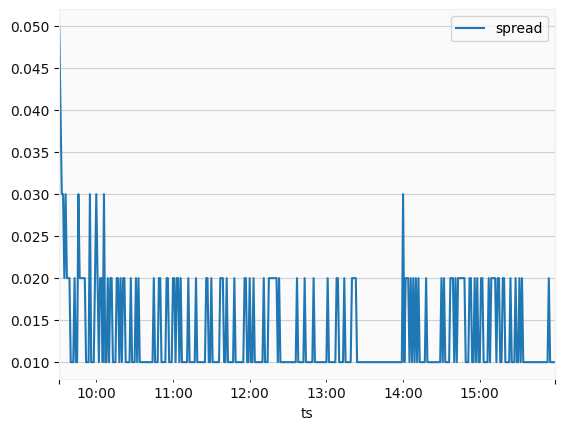

In [347]:
l2_q[['spread']].reset_index().groupby('ts').last().plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2077352815.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


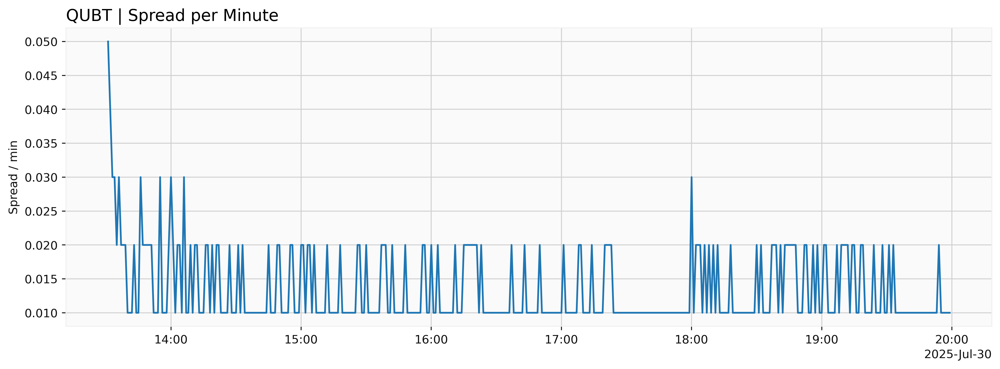

In [357]:
# AI generated for plot 
s = l2_q[['spread']].reset_index().groupby('ts').last().copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | Spread per Minute", loc="left", fontsize=14)
ax.set_ylabel("Spread / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_Spread_per_min.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

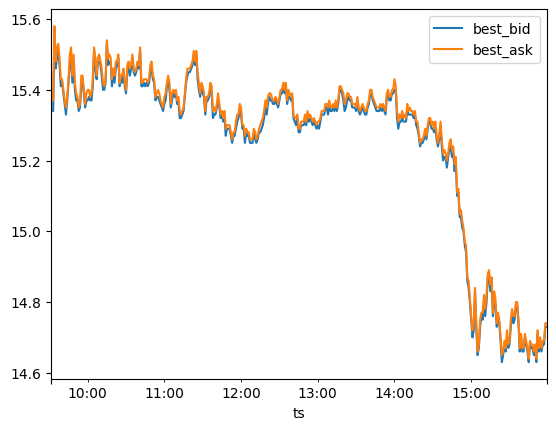

In [260]:
l2_q[['best_bid','best_ask']].reset_index().groupby('ts').last().plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/1570930484.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


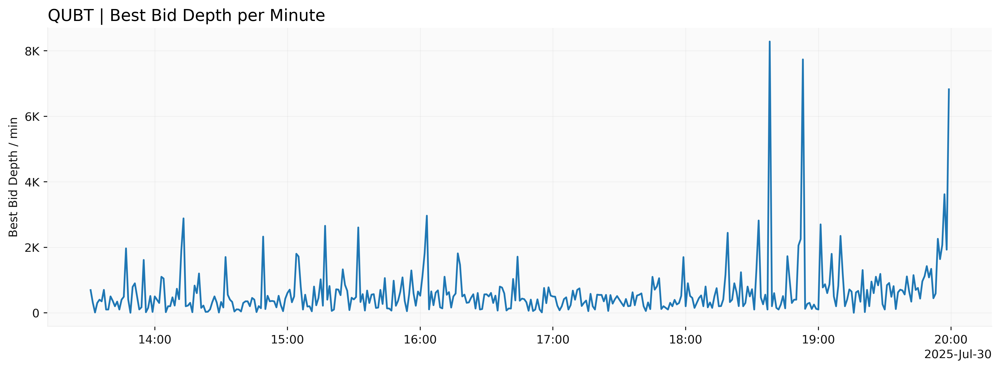

In [350]:
# AI generated for plot 
s = l2_q[['best_bid_depth']].reset_index().groupby('ts').last().copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | Best Bid Depth per Minute", loc="left", fontsize=14)
ax.set_ylabel("Best Bid Depth / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_best_bid_depth_per_min.png', dpi=400)
plt.show()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/4055928234.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


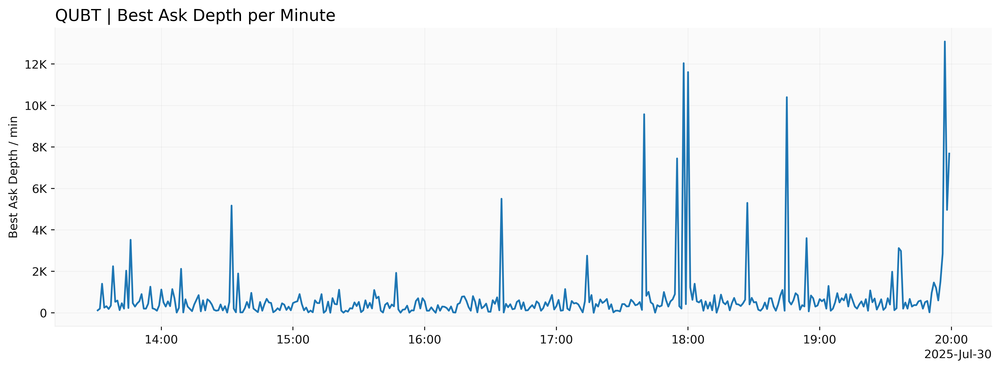

In [351]:
# AI generated for plot 
s = l2_q[['best_ask_depth']].reset_index().groupby('ts').last().copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | Best Ask Depth per Minute", loc="left", fontsize=14)
ax.set_ylabel("Best Ask Depth / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_best_ask_depth_per_min.png', dpi=400)
plt.show()

## f. Depth at twice the day's average spread

In [261]:
%time
day_avg_spread_q = l2_q.spread.mean()
print(f'the day avg spread is :{day_avg_spread_q}')

CPU times: user 1e+03 ns, sys: 1 μs, total: 2 μs
Wall time: 3.1 μs
the day avg spread is :0.013392024310086556


In [262]:
%time
troncated_l2_q = l2_q[((l2_q.side == "A") & (l2_q.price < l2_q.mid_price + day_avg_spread_q)) | ((l2_q.side == "B") & (l2_q.price > l2_q.mid_price - day_avg_spread_q))]
display(troncated_l2_q)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 1.91 μs


,side,price,depth,best_bid,best_ask,best_bid_depth,best_ask_depth,spread,rel_spread,mid_price
ts,,,,,,,,,,
2025-07-30 09:35:00-04:00,A,15.48,316,15.46,15.48,400,316,0.02,0.001293,15.470
2025-07-30 09:35:00-04:00,B,15.46,400,15.46,15.48,400,316,0.02,0.001293,15.470
2025-07-30 09:37:00-04:00,A,15.53,350,15.51,15.53,700,350,0.02,0.001289,15.520
2025-07-30 09:37:00-04:00,B,15.51,700,15.51,15.53,700,350,0.02,0.001289,15.520
2025-07-30 09:38:00-04:00,A,15.49,2244,15.47,15.49,100,2244,0.02,0.001292,15.480
...,...,...,...,...,...,...,...,...,...,...
2025-07-30 15:57:00-04:00,B,14.68,3620,14.68,14.69,3620,13086,0.01,0.000681,14.685
2025-07-30 15:58:00-04:00,A,14.74,4964,14.73,14.74,1928,4964,0.01,0.000679,14.735
2025-07-30 15:58:00-04:00,B,14.73,1928,14.73,14.74,1928,4964,0.01,0.000679,14.735


In [263]:
%time
depth_q = troncated_l2_q.groupby(['ts','side'], observed=True)['depth'].sum()      

# Build the full grid (all minutes × both sides)
ts_idx = depth_q.index.get_level_values(0)           
tz = getattr(ts_idx[0], 'tz', None)

start = ts_idx.min().floor('min')
end = ts_idx.max().ceil('min')
all_ts = pd.date_range(start, end, freq='min', tz=tz)

full_idx = pd.MultiIndex.from_product([all_ts, ['A','B']], names=['ts','side'])

# reindex and fill with 0
depth_full_q = depth_q.reindex(full_idx, fill_value=0).reset_index()
display(depth_full_q)

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 3.1 μs


,ts,side,depth
0,2025-07-30 09:35:00-04:00,A,316
1,2025-07-30 09:35:00-04:00,B,400
2,2025-07-30 09:36:00-04:00,A,0
3,2025-07-30 09:36:00-04:00,B,0
4,2025-07-30 09:37:00-04:00,A,350
...,...,...,...
765,2025-07-30 15:57:00-04:00,B,3620
766,2025-07-30 15:58:00-04:00,A,4964
767,2025-07-30 15:58:00-04:00,B,1928
768,2025-07-30 15:59:00-04:00,A,7680


<Axes: >

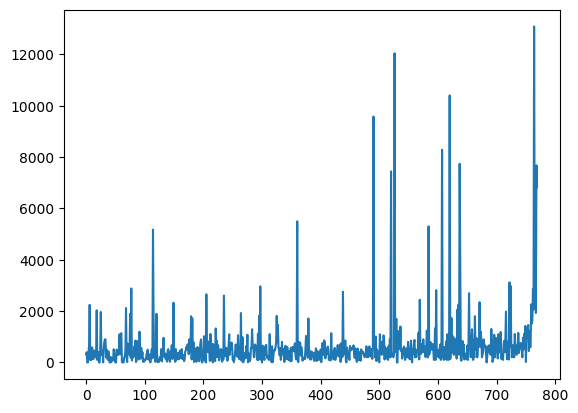

In [264]:
depth_full_q['depth'].plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/78293228.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


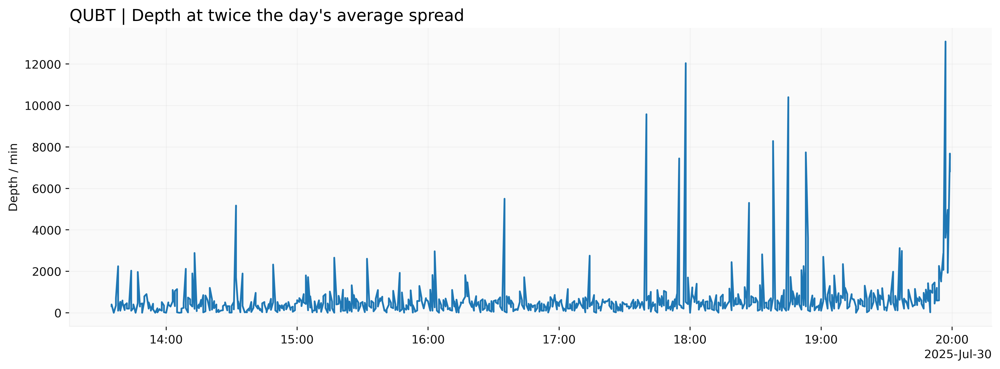

In [363]:
# AI generated for plot 
s = depth_full_q[['depth','ts']].set_index('ts').copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | Depth at twice the day's average spread", loc="left", fontsize=14)
ax.set_ylabel("Depth / min")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_depth_twice_avg_spread.png', dpi=400)
plt.show()

## g. Price impact

In [383]:
# We need a sec/sec l2
%time
orders = {}  # order_id -> (side, px, qty)
levels_bid = defaultdict(int)  # px -> total qty
levels_ask = defaultdict(int)
recs = []

mbo_q['seconde'] = mbo_q['ts'].dt.floor('s')
current = mbo_q.seconde.iloc[0]

for r in tqdm(mbo_q.itertuples(index=False), total=len(mbo_q)):
    act, oid, side, px, sz = r.action, int(r.order_id), r.side, float(r.px), int(r.size)

    # Snapshot each seconds
    if  r.seconde > current: 
        bb, bq = best(levels_bid, True)
        ba, aq = best(levels_ask, False)
        spread = ba - bb
        for p,q in levels_ask.items():
            if q > 0:
                recs.append((r.seconde, 'A', p, q, bb, ba, bq, aq, spread))
        for p,q in levels_bid.items():
            if q > 0:
                recs.append((r.seconde, 'B', p, q, bb, ba, bq, aq, spread))
        current = r.seconde

    if act in ('A','F'):  # Add
        if oid in orders:
            s_old, p_old, q_old = orders.pop(oid)
            (levels_bid if s_old=='B' else levels_ask)[p_old] -= q_old
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    elif act == 'C':      # Cancel (réduction)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            dq = min(sz, q_old)
            q_new = q_old - dq
            if s_old=='B': 
                levels_bid[p_old] -= dq
            else:          
                levels_ask[p_old] -= dq
            if q_new > 0:
                orders[oid] = (s_old, p_old, q_new)
            else:
                orders.pop(oid, None)

    elif act == 'R':      # Replace (price and/or qty)
        if oid in orders:
            s_old, p_old, q_old = orders[oid]
            # get rid of the previous
            if s_old=='B': 
                levels_bid[p_old] -= q_old
            else:          
                levels_ask[p_old] -= q_old
        # save the new (px, sz)
        orders[oid] = (side, px, sz)
        (levels_bid if side=='B' else levels_ask)[px] += sz

    # 'T' (print) n'affecte pas le carnet ici; la diminution liée aux exécutions passe via 'C'


l2_q = pd.DataFrame(recs, columns=['ts','side','price','depth','best_bid','best_ask','best_bid_depth','best_ask_depth','spread'])
l2_q['rel_spread'] = l2_q['spread'] / ((l2_q['best_bid'] + l2_q['best_ask'])/2)
l2_q['mid_price'] = (l2_q['best_bid'] + l2_q['best_ask'])/2

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 3.1 μs


100%|██████████| 536154/536154 [00:16<00:00, 31757.68it/s]


In [404]:
%time
tr = trades_q.loc[trades_q['side'].isin(['A','B']), ['ts','side']].copy()
tr = tr.sort_values('ts')
tr['sign'] = tr['side'].map({'B': +1, 'A': -1}).astype(int)

mids = (l2_q[['ts','mid_price']]
        .drop_duplicates('ts', keep='last')
        .sort_values('ts'))
tr = (pd.merge_asof(tr, mids, on='ts', direction='backward')
        .rename(columns={'mid_price':'mid0'}))

tr['ts_h'] = tr['ts'] + pd.Timedelta(seconds=5)
mids_h = mids.rename(columns={'ts':'ts_h', 'mid_price':'mid5'})
tr = pd.merge_asof(tr.sort_values('ts_h'), mids_h, on='ts_h', direction='backward')

tr = tr.dropna(subset=['mid0','mid5'])
tr['log_r_5s'] = np.log(tr['mid5'] / tr['mid0'])
tr['minute']   = tr['ts'].dt.floor('min')

def ols_beta(g):
    x = g['sign'].to_numpy(float)
    y = g['log_r_5s'].to_numpy(float)
    if x.size < 2 or np.var(x) == 0:
        return pd.Series({'alpha': np.nan, 'beta_5s': np.nan, 'n': x.size})
    X = np.column_stack([np.ones_like(x), x])
    alpha, beta = np.linalg.lstsq(X, y, rcond=None)[0]
    return pd.Series({'alpha': alpha, 'beta_5s': beta, 'n': x.size})

price_impact_q = (tr.groupby('minute', observed=True)
                  .apply(ols_beta)
                  .reset_index())


CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.15 μs


/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2037839930.py:30: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(ols_beta)


In [405]:
display(price_impact_q)

,minute,alpha,beta_5s,n
0,2025-07-30 13:30:00+00:00,0.002866,0.002057,137.0
1,2025-07-30 13:31:00+00:00,0.000244,0.000323,80.0
2,2025-07-30 13:32:00+00:00,0.001599,0.000298,85.0
3,2025-07-30 13:33:00+00:00,0.001879,0.000328,66.0
4,2025-07-30 13:34:00+00:00,-0.000004,0.000297,53.0
...,...,...,...,...
378,2025-07-30 19:55:00+00:00,0.000237,0.000369,103.0
379,2025-07-30 19:56:00+00:00,0.000020,0.000379,125.0
380,2025-07-30 19:57:00+00:00,0.000151,0.000695,101.0
381,2025-07-30 19:58:00+00:00,0.000004,0.000631,132.0


<Axes: >

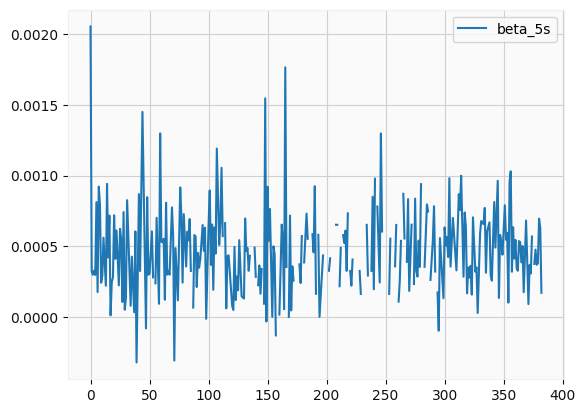

In [406]:
price_impact_q[['beta_5s']].plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/815924776.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


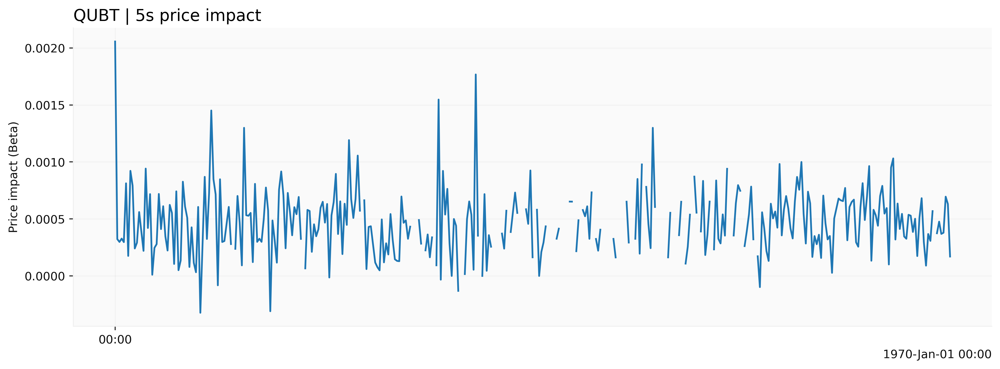

In [407]:
# AI generated for plot 
s = price_impact_q[['beta_5s']].copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | 5s price impact", loc="left", fontsize=14)
ax.set_ylabel("Price impact (Beta)")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_price_impact.png', dpi=400)
plt.show()

## h. 1 min midquote and transaction price

In [276]:
mid_1s_q = l2_q[['ts','mid_price']].groupby('ts').last()['mid_price']
mid_1m_q = l2_q[['ts','mid_price']].groupby('ts').last()['mid_price'].resample('1min', label='left', closed='left').last().ffill()

<Axes: xlabel='ts'>

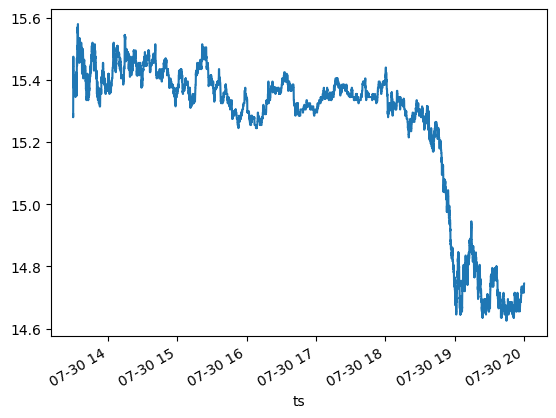

In [277]:
mid_1s_q.plot()

<Axes: xlabel='ts'>

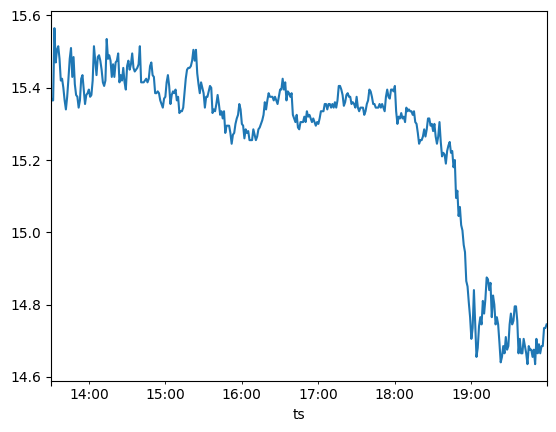

In [278]:
mid_1m_q.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/682792209.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


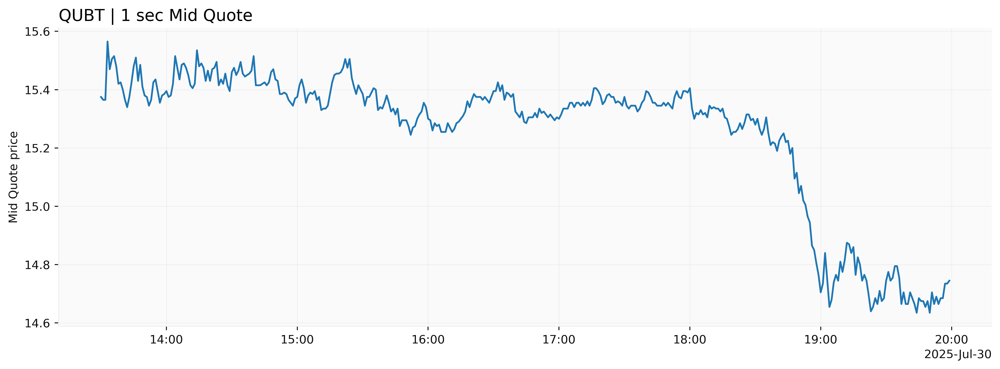

In [369]:
# AI generated for plot 
s = mid_1m_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | 1 sec Mid Quote", loc="left", fontsize=14)
ax.set_ylabel("Mid Quote price")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_mid.png', dpi=400)
plt.show()

In [279]:
%time
trades_q = mbo_q[mbo_q.action == 'T'].copy()
px_1s_q = trades_q.set_index('ts')['px'].resample('1s', label='left', closed='left').last() 
px_1min_q = trades_q.set_index('ts')['px'].resample('1min', label='left', closed='left').last() 

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.15 μs


<Axes: xlabel='ts'>

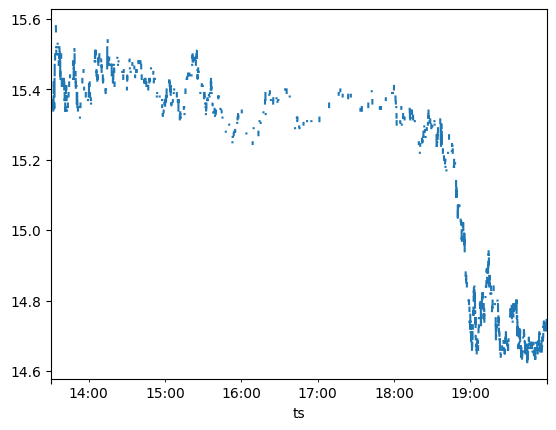

In [280]:
px_1s_q.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/728500339.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


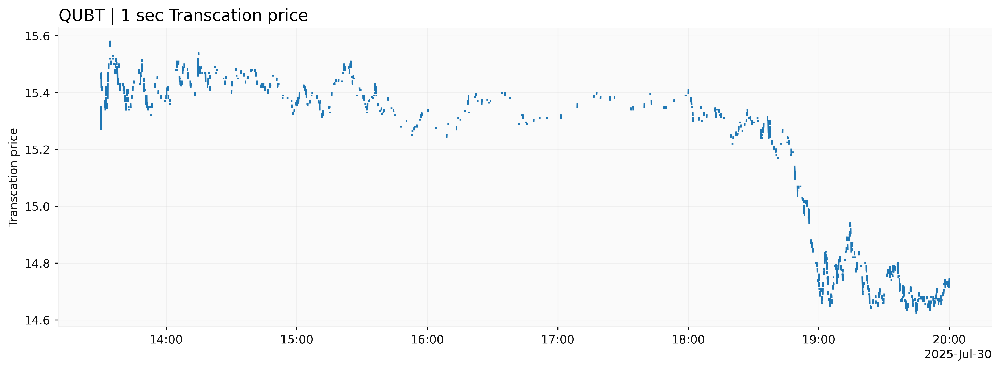

In [368]:
# AI generated for plot 
s = px_1s_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | 1 sec Transcation price", loc="left", fontsize=14)
ax.set_ylabel("Transcation price")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_px.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

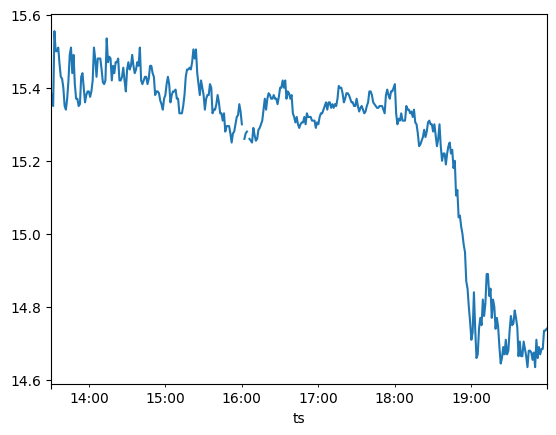

In [281]:
px_1min_q.plot()

## i. Log returns

In [282]:
%time
ret_mid_1s_q = np.log(mid_1s_q.shift()/mid_1s_q).dropna() 
ret_mid_1m_q = np.log(mid_1m_q.shift()/mid_1m_q).dropna() 

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 3.1 μs


<Axes: xlabel='ts'>

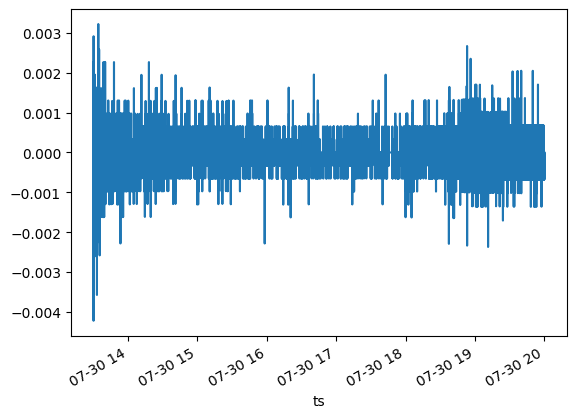

In [283]:
ret_mid_1s_q.plot()

<Axes: xlabel='ts'>

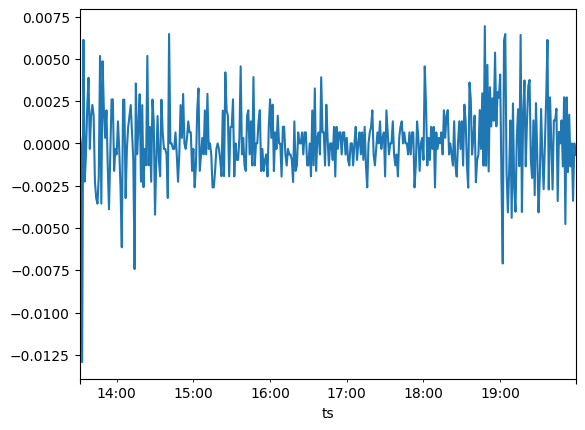

In [284]:
ret_mid_1m_q.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/851683935.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


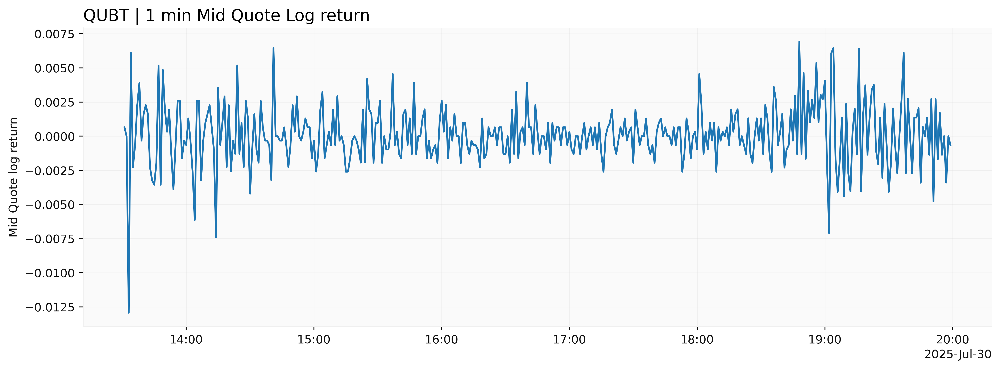

In [376]:
# AI generated for plot 
s = ret_mid_1m_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | 1 min Mid Quote Log return", loc="left", fontsize=14)
ax.set_ylabel("Mid Quote log return")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_mid_return.png', dpi=400)
plt.show()

In [285]:
%time
ret_px_1m_q = np.log(px_1min_q.shift()/px_1min_q)
ret_px_1s_q = np.log(px_1s_q.shift()/px_1s_q)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 1.91 μs


<Axes: xlabel='ts'>

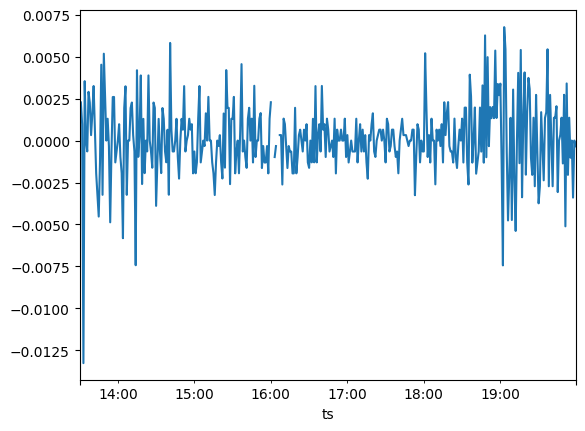

In [286]:
ret_px_1m_q.plot()

/var/folders/tn/md278c0j7rn5h9f_28zsysl00000gn/T/ipykernel_6947/2795788941.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False)


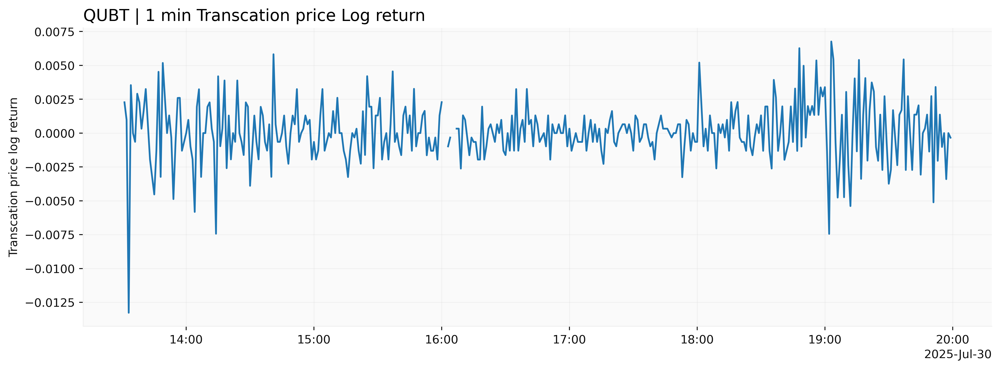

In [377]:
# AI generated for plot 
s = ret_px_1m_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | 1 min Transcation price Log return", loc="left", fontsize=14)
ax.set_ylabel("Transcation price log return")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_px_return.png', dpi=400)
plt.show()

<Axes: xlabel='ts'>

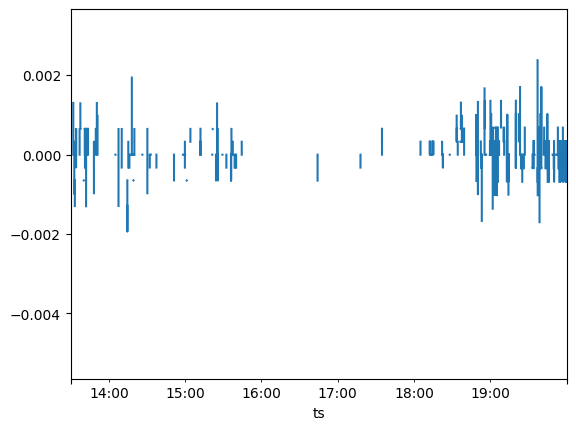

In [287]:
ret_px_1s_q.plot()

In [ ]:
# AI generated for plot 
s = ret_mid_1m_q.copy()
s.index = pd.to_datetime(s.index)
s = s.sort_index()

fig, ax = plt.subplots(figsize=(12,4.5), dpi=400)

# format Y en K/M/B
# fmt = lambda x,_: f"{x/1e9:.1f}B" if abs(x)>=1e9 else (f"{x/1e6:.1f}M" if abs(x)>=1e6 else (f"{x/1e3:.0f}K" if abs(x)>=1e3 else f"{x:.0f}"))
# ax.yaxis.set_major_formatter(FuncFormatter(fmt))

# axes propres
ax.grid(True, which="major", linewidth=0.6, alpha=0.25)
ax.grid(True, which="minor", linewidth=0.4, alpha=0.15)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

# dates compactes
loc = mdates.AutoDateLocator(); ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(loc))

ax.plot(s)

ax.set_title("QUBT | 1 sec Mid Quote Log return", loc="left", fontsize=14)
ax.set_ylabel("Mid Quote log price")
ax.legend(frameon=False)
fig.tight_layout()
plt.savefig('plot_rapport/QUBT_mid_return.png', dpi=400)
plt.show()

## j. realized variance 

In [288]:
print(f'The realized variance for the midquotes is {np.pow(ret_mid_1m_q,2).sum()}')
print(f'The realized variance for the transaction prices is {np.pow(ret_px_1m_q,2).sum()}')

The realized variance for the midquotes is 0.0018583747961987882
The realized variance for the transaction prices is 0.0017876602928930882


## k. ACF

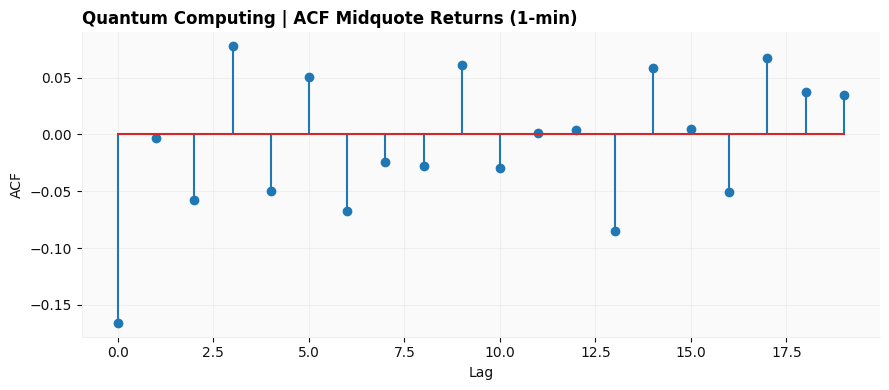

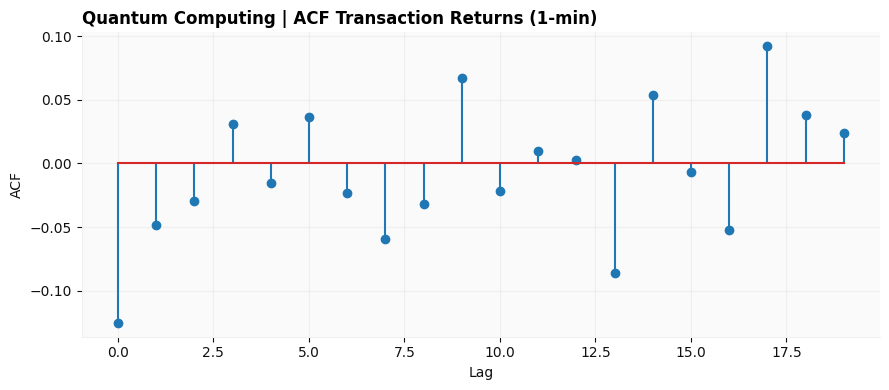

In [411]:
ac_mid_q = safe_acf(ret_mid_1m_q, nlags=20)[1:]
ac_px_q  = safe_acf(ret_px_1m_q,  nlags=20)[1:]

# Midquote
fig, ax = plt.subplots(figsize=(9,4))
ax.stem(range(len(ac_mid_q)), ac_mid_q)
apply_timeseries_style(ax, "Quantum Computing | ACF Midquote Returns (1-min)", "ACF")
ax.set_xlabel("Lag")
plt.tight_layout()
plt.savefig('plot_rapport/QUBT_acf_mid.png', dpi=300)

# Transaction
fig, ax = plt.subplots(figsize=(9,4))
ax.stem(range(len(ac_px_q)), ac_px_q)
apply_timeseries_style(ax, "Quantum Computing | ACF Transaction Returns (1-min)", "ACF")
ax.set_xlabel("Lag")
plt.tight_layout()
plt.savefig('plot_rapport/QUBT_acf_px.png', dpi=300)